# The Gini coefficient in this  code is sourced from Gini Coefficient calculation.ipynb

# The combination of Gini (charging station+solar/wind)

In [ ]:
import pandas as pd

# Final output filename
output_file = 'gini_results_all_USA_CityCombinations_Windsolar_modified.csv'

# Step 1: Read the original CSV and remove unnecessary columns
input_csv_path = 'gini_results_all_USA_CityCombinations_Windsolar.csv'

# Load data
df = pd.read_csv(input_csv_path)

# Drop unnecessary columns
df.drop(columns=['State', 'CountyFP', 'City'], inplace=True, errors='ignore')  # Include errors to prevent errors if columns do not exist

# Step 2: Rename columns
df.rename(columns={'CountyNS': 'City'}, inplace=True)
df.rename(columns={'Power_Density': 'power_density'}, inplace=True)

# Step 3: Modify values in the Supply_Type column (if the column exists)
if 'Supply_Type' in df.columns:
    df['Supply_Type'] = df['Supply_Type'].replace({'Power_Density': 'power_density'})

# Save the final result to the output file using UTF-8 encoding
df.to_csv(output_file, index=False, encoding='utf-8')

print(f"Processing completed. The final file has been saved as: {output_file}")

In [2]:

import pandas as pd
import chardet

# Define file paths and corresponding region labels
file_regions = [
    ('gini_results_all_USA_CityCombinations_Windsolar_modified.csv', 'USA'),
    ('gini_results_all_China_CityCombinations_Windsolar.csv', 'China'),
    ('gini_coefficients_all_EU_citiesWindSolar.csv', 'EU')
]

# Create an empty list to store DataFrames from each region
dfs = []

# Detect encoding and read each file
for file, region in file_regions:
    # Detect file encoding
    with open(file, 'rb') as f:
        raw_data = f.read()
        result = chardet.detect(raw_data)
        detected_encoding = result['encoding']
        print(f"File: {file}, Detected Encoding: {detected_encoding}")

    try:
        if region == 'China':
            # Use utf-8-sig encoding for the China data file to handle BOM if present
            df = pd.read_csv(file, encoding='utf-8-sig')
        else:
            # Use the detected encoding for other regions
            df = pd.read_csv(file, encoding=detected_encoding)
    except Exception as e:
        print(f"Failed to read {file} with specified encoding. Trying fallback encoding.")
        # As a fallback, try reading with 'utf-8' encoding
        df = pd.read_csv(file, encoding='utf-8')

    # Add a Region column to identify the source region
    df['Region'] = region

    # Print the first few rows to verify data was read correctly
    print(df.head())

    # Append the DataFrame to the list
    dfs.append(df)

# Concatenate all DataFrames vertically (along rows)
combined_df = pd.concat(dfs, ignore_index=True)

# Save the combined DataFrame to a new CSV file using utf-8-sig encoding (to handle BOM for Excel compatibility)
output_file = 'Combined_gini_coefficients_all_regionsWindSolarUSAChinaEU.csv'
combined_df.to_csv(output_file, index=False, encoding='utf-8-sig')

print(f"Combined data saved as '{output_file}'")

File: gini_results_all_USA_CityCombinations_Windsolar_modified.csv, Detected Encoding: ascii
     City    Supply_Type  Gini_Coefficient Region
0  161527  power_density          0.628592    USA
1  161527      GHI_value          0.479545    USA
2  161528  power_density          0.144629    USA
3  161528      GHI_value          0.143259    USA
4  161533  power_density          0.576233    USA
File: gini_results_all_China_CityCombinations_Windsolar.csv, Detected Encoding: utf-8
  City    Supply_Type  Gini_Coefficient Region
0  万宁市  power_density          0.221146  China
1  万宁市      GHI_value          0.213041  China
2  三亚市  power_density          0.000000  China
3  三亚市      GHI_value          0.000000  China
4  三明市  power_density          0.857530  China
File: gini_coefficients_all_EU_citiesWindSolar.csv, Detected Encoding: utf-8
                              City    Supply_Type  Gini_Coefficient Region
0                        A CoruÃ±a  power_density          0.281506     EU
1           

# Merge the Gini coefficients of charging stations in the three regions

In [ ]:
import pandas as pd

# Define file paths
input_csv_path = 'gini_results_all_USA_CityCombinations_Nowindsolar.csv'
output_csv_path = 'gini_results_all_USA_CityCombinations_Nowindsolar_modified.csv'

# Read the CSV file
df = pd.read_csv(input_csv_path)

# Drop unnecessary columns
columns_to_drop = ['State', 'CountyFP', 'Supply_Type', 'City']
df.drop(columns=columns_to_drop, inplace=True)

# Rename the 'CountyNS' column to 'City'
df.rename(columns={'CountyNS': 'City'}, inplace=True)

# Save the updated DataFrame to a CSV file with UTF-8-sig encoding (for better compatibility with Excel)
df.to_csv(output_csv_path, index=False, encoding='utf-8-sig')
print(f"File successfully saved to {output_csv_path}, and 'CountyNS' has been renamed to 'City'")

In [ ]:
import pandas as pd

# Read the CSV file
df = pd.read_csv('gini_coefficients_all_EU_cities_Nowindsolar.csv')

# Remove the Supply_Type column
df = df.drop('Supply_Type', axis=1)

# Save the modified DataFrame to a new CSV file
df.to_csv('gini_coefficients_all_EU_cities_Nowindsolar_modified.csv', index=False)

In [5]:
import pandas as pd

# Define file paths and corresponding region labels
file_regions = [
    ('gini_results_all_USA_CityCombinations_Nowindsolar_modified.csv', 'USA'),
    ('gini_results_all_China_CityCombinations_Nowindsolar.csv', 'China'),
    ('gini_coefficients_all_EU_cities_Nowindsolar_modified.csv', 'EU')
]

# Create an empty list to store DataFrames from each region
dfs = []

# Loop through each CSV file, read it, and add a region identifier column
for file, region in file_regions:
    df = pd.read_csv(file, encoding='utf-8')
    df['Region'] = region
    dfs.append(df)

# Concatenate all DataFrames vertically (along rows)
combined_df = pd.concat(dfs, ignore_index=True)

# Save the combined DataFrame to a new CSV file
output_file = 'Combined_gini_coefficients_all_regionsNowindsolar.csv'
combined_df.to_csv(output_file, index=False, encoding='utf-8')

print(f"Combined data saved as '{output_file}'")

Combined data saved as 'Combined_gini_coefficients_all_regionsNowindsolar.csv'


# Fig 3(a)

Quartiles for Charging Station:
Region     China    Europe       USA
0.25    0.124994  0.183856  0.336882
0.50    0.207668  0.263333  0.448815
0.75    0.296002  0.348749  0.565759

Mean Gini Coefficient:
Region
China     0.221472
Europe    0.275386
USA       0.446780
Name: Gini_Coefficient, dtype: float64


Quartiles for Charging Station + Wind:
Region     China    Europe       USA
0.25    0.206891  0.220954  0.374532
0.50    0.305213  0.311366  0.504816
0.75    0.423657  0.419126  0.629299

Mean Gini Coefficient:
Region
China     0.335469
Europe    0.328806
USA       0.497499
Name: Gini_Coefficient, dtype: float64


Quartiles for Charging Station + Solar:
Region     China    Europe       USA
0.25    0.125420  0.184339  0.336798
0.50    0.209248  0.263013  0.449082
0.75    0.297101  0.347008  0.566381

Mean Gini Coefficient:
Region
China     0.221309
Europe    0.275296
USA       0.446830
Name: Gini_Coefficient, dtype: float64




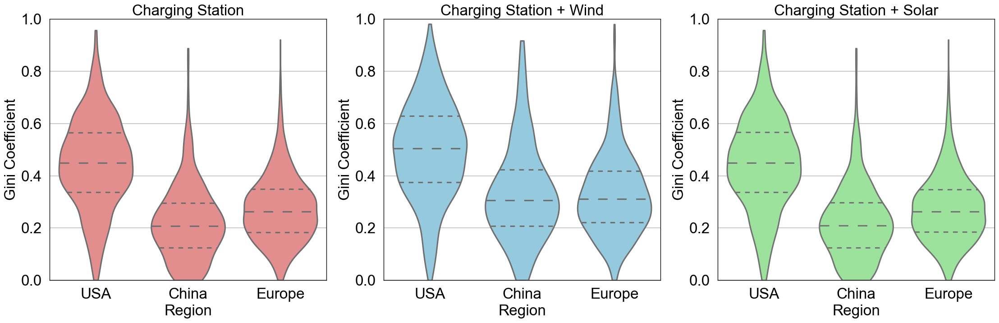

In [19]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Define file paths
csv_file_path_wind_solar = 'Combined_gini_coefficients_all_regionsWindSolarUSAChinaEU.csv'
csv_file_path_no_wind_solar = 'Combined_gini_coefficients_all_regionsNowindsolar.csv'

# Read CSV files using latin-1 encoding to avoid encoding issues
df_wind_solar = pd.read_csv(csv_file_path_wind_solar, encoding='latin-1')
df_no_wind_solar = pd.read_csv(csv_file_path_no_wind_solar, encoding='latin-1')

# Replace 'EU' with 'Europe' for consistent labeling
df_wind_solar['Region'] = df_wind_solar['Region'].replace('EU', 'Europe')
df_no_wind_solar['Region'] = df_no_wind_solar['Region'].replace('EU', 'Europe')

# Process the wind and solar dataset
# Extract Energy_Type based on Supply_Type
df_wind_solar['Supply_Type'] = df_wind_solar['Supply_Type'].str.strip().str.lower()
df_wind_solar['Energy_Type'] = df_wind_solar['Supply_Type'].replace({
    'power_density': 'Wind',
    'ghi_value': 'Photovoltaic'  # Correct mapping to Photovoltaic (solar)
})

# For the non-wind-solar dataset, assign a uniform Energy_Type
df_no_wind_solar['Energy_Type'] = 'Other'

# Rename columns to ensure consistency (here, confirming Gini column name is aligned)
df_no_wind_solar = df_no_wind_solar.rename(columns={'Gini_Coefficient': 'Gini_Coefficient'})

# Combine both datasets
df_combined = pd.concat([df_wind_solar, df_no_wind_solar], ignore_index=True)

# Set Seaborn style for better visual appearance
sns.set(style="whitegrid", context="talk")

# Create a 1-row, 3-column subplot layout
fig, axes = plt.subplots(1, 3, figsize=(22.5, 7.5))

# Define the violin plot function
def plot_violin(data, energy_type, color, title, ax):
    energy_df = data[data['Energy_Type'] == energy_type]
    
    if not energy_df.empty:
        sns.violinplot(
            x='Region',
            y='Gini_Coefficient',
            data=energy_df,
            inner='quartile',
            scale='width',
            palette=[color],
            ax=ax,
            cut=0  # Prevents kernel density estimation from extending beyond data range
        )
        
        ax.set_ylim(0, 1)
        ax.set_title(title, fontsize=24, color='black')
        ax.set_xlabel('Region', fontsize=24, color='black')
        ax.set_ylabel('Gini Coefficient', fontsize=24, color='black')
        ax.tick_params(axis='both', which='major', labelsize=24, colors='black')

        # Print quartiles and mean values for analysis
        print(f"Quartiles for {title}:")
        quartiles = energy_df.groupby('Region')['Gini_Coefficient'].quantile([0.25, 0.5, 0.75])
        print(quartiles.unstack(level=0))
        print("\nMean Gini Coefficient:")
        mean_values = energy_df.groupby('Region')['Gini_Coefficient'].mean()
        print(mean_values)
        print("\n")

        # Set black border (spines) around each subplot
        for spine in ax.spines.values():
            spine.set_color('black')
            spine.set_linewidth(1)

# Generate violin plots in the specified order
plot_violin(df_combined, 'Other', 'lightcoral', 'Charging Station', axes[0])
plot_violin(df_combined, 'Wind', 'skyblue', 'Charging Station + Wind', axes[1])
plot_violin(df_combined, 'Photovoltaic', 'lightgreen', 'Charging Station + Solar', axes[2])

# Adjust layout to prevent overlap
plt.tight_layout()

# Display the plot
plt.show()

# The combination of the three Gini coefficients in the three regions prepares for spatial autocorrelation

In [12]:
import pandas as pd
import chardet

# Define file paths and corresponding region labels
file_regions = [
    ('gini_results_all_USA_CityCombinations_Windsolar_modified.csv', 'USA'),
    ('gini_results_all_China_CityCombinations_Windsolar.csv', 'China'),
    ('gini_coefficients_all_EU_citiesWindSolar.csv', 'EU')
]

# Create an empty list to store processed DataFrames
dfs = []

# Detect encoding and read each file, then transform the data
for file, region in file_regions:
    # Detect file encoding
    with open(file, 'rb') as f:
        raw_data = f.read()
        result = chardet.detect(raw_data)
        detected_encoding = result['encoding']
        print(f"File: {file}, Detected Encoding: {detected_encoding}")

    try:
        if region == 'China':
            # Use utf-8-sig encoding for the China data file to handle BOM (Byte Order Mark)
            df = pd.read_csv(file, encoding='utf-8-sig')
        else:
            # For other regions, use the detected encoding
            df = pd.read_csv(file, encoding=detected_encoding)
    except Exception as e:
        print(f"Failed to read {file} with specified encoding. Trying fallback encoding.")
        # As a fallback, try reading with 'utf-8' encoding
        df = pd.read_csv(file, encoding='utf-8')

    # Add a Region column to identify the source region
    df['Region'] = region

    # Reshape wind/solar data: pivot Supply_Type rows into separate columns
    df_pivot = df.pivot_table(
        index=['City', 'Region'], 
        columns='Supply_Type', 
        values='Gini_Coefficient',
        aggfunc='first'  # Use first value in case of duplicates
    ).reset_index()

    # Ensure consistent data types for 'City' and 'Region' (convert to string)
    df_pivot['City'] = df_pivot['City'].astype(str)
    df_pivot['Region'] = df_pivot['Region'].astype(str)

    # Remove the name of the columns index (from pivot)
    df_pivot.columns.name = None

    # Rename the pivoted columns and append 'Gini' suffix for clarity
    df_pivot = df_pivot.rename(columns={
        'power_density': 'power_densityGini',
        'GHI_value': 'GHI_valueGini'
    })

    # Print the first few rows to verify correct reading and transformation
    print(df_pivot.head())

    # Append the processed DataFrame to the list
    dfs.append(df_pivot)

# Concatenate all processed DataFrames vertically (along rows)
combined_df = pd.concat(dfs, ignore_index=True)

# Save the combined and transformed DataFrame to a new CSV file using utf-8-sig encoding
# (utf-8-sig handles BOM for better compatibility with Excel)
output_file = 'Combined_gini_coefficients_all_regionsWindsolar.csv'
combined_df.to_csv(output_file, index=False, encoding='utf-8-sig')

print(f"Combined and transformed data saved as '{output_file}'")

File: gini_results_all_USA_CityCombinations_Windsolar_modified.csv, Detected Encoding: ascii
    City Region  GHI_valueGini  power_densityGini
0  23901    USA       0.639158           0.665579
1  25442    USA       0.362447           0.536229
2  25443    USA       0.192020           0.100444
3  25445    USA       0.780584           0.832539
4  25446    USA       0.473571           0.627979
File: gini_results_all_China_CityCombinations_Windsolar.csv, Detected Encoding: utf-8
   City Region  GHI_valueGini  power_densityGini
0   万宁市  China       0.213041           0.221146
1   三亚市  China       0.000000           0.000000
2   三明市  China       0.258789           0.857530
3  三门峡市  China       0.244656           0.285694
4   上海市  China       0.027560           0.341442
File: gini_coefficients_all_EU_citiesWindSolar.csv, Detected Encoding: utf-8
                              City Region  GHI_valueGini  power_densityGini
0                        A CoruÃ±a     EU       0.227426           0.28150

In [ ]:
import pandas as pd

# Read and process the first dataset: Wind and PV Gini coefficients
df_wind_pv = pd.read_csv('Combined_gini_coefficients_all_regionsWindsolar.csv')
df_wind_pv['地区序号'] = df_wind_pv.groupby('Region').cumcount() + 1  # Assign sequential ID per region
df_wind_pv = df_wind_pv[['地区序号', 'City', 'Region', 'GHI_valueGini', 'power_densityGini']]
df_wind_pv.rename(columns={
    'GHI_valueGini': 'solar_Gini',
    'power_densityGini': 'wind_Gini'
}, inplace=True)

# Read and process the second dataset: Charging station Gini coefficients
df_nowind = pd.read_csv('Combined_gini_coefficients_all_regionsNOWindsolar.csv')
df_nowind['地区序号'] = df_nowind.groupby('Region').cumcount() + 1  # Assign sequential ID per region
df_nowind = df_nowind[['地区序号', 'City', 'Gini_Coefficient', 'Region']]
df_nowind.rename(columns={'Gini_Coefficient': 'charging_station_Gini'}, inplace=True)

# Read and process the third dataset: Coverage and density information
df_coverage = pd.read_csv('combined_city_PV_wind_matching_level_with_area22.csv')
df_coverage['地区序号'] = df_coverage.groupby('Area').cumcount() + 1  # Assign sequential ID per area
df_coverage = df_coverage[[
    '地区序号', 'City', 'avg_PV_matching_level', 'charging_station_count',
    'avg_PV_value', 'Area', 'avg_wind_matching_level', 'avg_power_density'
]]
df_coverage.rename(columns={'Area': 'Region'}, inplace=True)  # Rename 'Area' to 'Region' for consistency

# Merge datasets separately for Europe and for China/USA due to different matching strategies

# For Europe: Use '地区序号' (sequential ID) to match records
df_coverage_eu = df_coverage[df_coverage['Region'] == 'EU'].copy()
df_nowind_eu = df_nowind[df_nowind['Region'] == 'EU'].copy()

merged_eu_coverage_nowind = pd.merge(
    df_coverage_eu, df_nowind_eu,
    on='地区序号',
    how='left',
    suffixes=('', '_nowind')
)

# Then merge with wind and PV Gini data
df_wind_pv_eu = df_wind_pv[df_wind_pv['Region'] == 'EU'].copy()
merged_eu_final = pd.merge(
    merged_eu_coverage_nowind, df_wind_pv_eu,
    on='地区序号',
    how='left',
    suffixes=('', '_windpv')
)

# For China and USA: Use 'City' name to match records
df_coverage_other = df_coverage[df_coverage['Region'].isin(['China', 'USA'])].copy()
df_nowind_other = df_nowind[df_nowind['Region'].isin(['China', 'USA'])].copy()

merged_other_coverage_nowind = pd.merge(
    df_coverage_other, df_nowind_other,
    on='City',
    how='left',
    suffixes=('', '_nowind')
)

# Then merge with wind and PV Gini data
df_wind_pv_other = df_wind_pv[df_wind_pv['Region'].isin(['China', 'USA'])].copy()
merged_other_final = pd.merge(
    merged_other_coverage_nowind, df_wind_pv_other,
    on='City',
    how='left',
    suffixes=('', '_windpv')
)

# Combine the Europe and (China/USA) merged datasets
final_merged = pd.concat([merged_eu_final, merged_other_final], ignore_index=True)

# Clean up column names: Remove duplicate columns
final_merged = final_merged.loc[:, ~final_merged.columns.duplicated()]

# Keep only the desired columns
columns_to_keep = [
    '地区序号', 'City', 'avg_PV_matching_level', 'charging_station_count',
    'avg_PV_value', 'Region', 'avg_wind_matching_level', 'avg_power_density',
    'charging_station_Gini', 'solar_Gini', 'wind_Gini'
]
final_merged = final_merged[columns_to_keep]

# Save the final merged dataset
output_file = 'final_merged_all_data1.csv'
final_merged.to_csv(output_file, index=False, encoding='utf-8-sig')

print(f"✅ Final data merging completed! Results saved to {output_file}")
print("\n📄 Sample of the merged data:")
print(final_merged.head(10))

In [ ]:
import pandas as pd
import geopandas as gpd

# Define file paths
csv_file = 'final_merged_all_data.csv'
china_city_geojson = '中国_市.geojson'
us_counties_geojson = 'counties.geojson'
eu_nuts_geojson = 'NUTS_RG_20M_2021_4326.geojson'

# Read the CSV file
df_csv = pd.read_csv(csv_file)

# Read the GeoJSON files using the pyogrio engine for better performance
gdf_china = gpd.read_file(china_city_geojson, engine='pyogrio')
gdf_us = gpd.read_file(us_counties_geojson, engine='pyogrio')
gdf_eu = gpd.read_file(eu_nuts_geojson, engine='pyogrio')

# Ensure the China GeoDataFrame uses EPSG:4326 (WGS84) coordinate reference system
if gdf_china.crs.to_epsg() != 4326:
    gdf_china = gdf_china.to_crs(epsg=4326)
    print("Converted 中国_市.geojson to EPSG:4326")

# Preprocess the U.S. county numeric identifier from the CSV to match the COUNTYNF format in the GeoJSON
def format_county_ns(county_ns):
    return str(county_ns).zfill(8)  # Zero-pad to 8 digits

# Extract and format the U.S. county identifier from the 'City' column where Region is 'USA'
df_csv_us = df_csv[df_csv['Region'] == 'USA'].copy()
df_csv_us['COUNTYNS'] = df_csv_us['City'].apply(format_county_ns)

# Merge data with spatial layers
# China: Merge on city name ('name' in GeoJSON and 'City' in CSV)
gdf_china_merged = gdf_china.merge(
    df_csv[df_csv['Region'] == 'China'],
    left_on='name',
    right_on='City',
    how='left'
)
print(f"Number of Chinese cities with new data: {gdf_china_merged['City'].notna().sum()}")

# USA: Merge on formatted COUNTYNS field
gdf_us_merged = gdf_us.merge(
    df_csv_us,
    left_on='COUNTYNS',
    right_on='COUNTYNS',
    how='left'
)
print(f"Number of U.S. counties with new data: {gdf_us_merged['City'].notna().sum()}")

# EU: Merge on region name (NUTS_NAME in GeoJSON and 'City' in CSV)
gdf_eu_merged = gdf_eu.merge(
    df_csv[df_csv['Region'] == 'EU'],
    left_on='NUTS_NAME',
    right_on='City',
    how='left'
)
print(f"Number of EU regions with new data: {gdf_eu_merged['City'].notna().sum()}")

# Save the merged GeoDataFrames to new GeoJSON files
output_china = 'China_cities_with_Gini.geojson'
output_us = 'Us_counties_with_Gini.geojson'
output_eu = 'Eu_nuts_with_Gini.geojson'

gdf_china_merged.to_file(output_china, driver='GeoJSON')
gdf_us_merged.to_file(output_us, driver='GeoJSON')
gdf_eu_merged.to_file(output_eu, driver='GeoJSON')

print(f"New GeoJSON files have been saved to: {output_china}, {output_us}, and {output_eu}")

# Figure 3b spatial autocorrelation visualization

C:\Users\ZF\anaconda3\envs\new_env_spatial1\lib\site-packages\pyogrio\core.py:35: RuntimeWarning: Could not detect GDAL data files.  Set GDAL_DATA environment variable to the correct path.
  _init_gdal_data()


Checking for invalid geometries...
Found 1 invalid geometries, attempting to fix them.


C:\Windows\Temp\ipykernel_15944\4170063775.py:26: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  merged_geometry = boundary_gdf.unary_union
C:\Windows\Temp\ipykernel_15944\4170063775.py:44: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  coords = np.column_stack((gdf_analysis.centroid.x, gdf_analysis.centroid.y))


Charging Station Gini:
Moran's I = 0.332 (p = 0.0010)
Solar Gini:
Moran's I = 0.333 (p = 0.0010)
Wind Gini:
Moran's I = 0.324 (p = 0.0010)


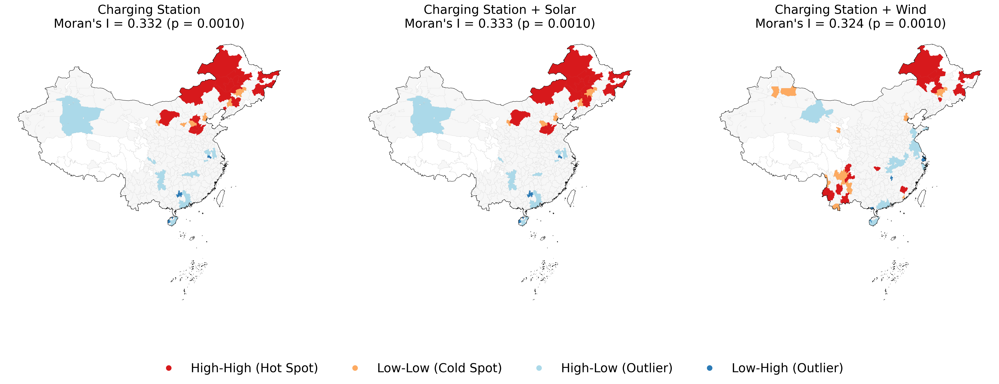

In [1]:
import geopandas as gpd
from esda.moran import Moran, Moran_Local
from libpysal.weights import KNN
import numpy as np
import matplotlib.pyplot as plt

# Define the Gini coefficient fields to analyze
gini_fields = ['charging_station_Gini', 'solar_Gini', 'wind_Gini']

# Load the GeoJSON data (include all cities)
gdf = gpd.read_file('china_cities_with_Gini.geojson', engine='pyogrio')

# [New] Load the administrative boundary file for Chinese cities to construct the national outline
boundary_gdf = gpd.read_file('中国_市.geojson', engine='pyogrio')

# Check and repair invalid geometries in the boundary dataset
print("Checking for invalid geometries...")
invalid_geoms = boundary_gdf[~boundary_gdf.geometry.is_valid]
if not invalid_geoms.empty:
    print(f"Found {len(invalid_geoms)} invalid geometries, attempting to fix them.")
    # Use buffer(0) trick to attempt fixing invalid geometries
    boundary_gdf['geometry'] = boundary_gdf.buffer(0)

# Try to merge all geometries and extract the outer boundary
try:
    # Use unary_union to combine all geometries into a single shape
    merged_geometry = boundary_gdf.unary_union
    if merged_geometry is None or merged_geometry.is_empty:
        raise ValueError("Merged geometry is empty. Please check if input data is complete.")

    # Extract the outer boundary (outline) of the merged shape
    china_outline = merged_geometry.boundary
    if china_outline is None or china_outline.is_empty:
        raise ValueError("Extracted boundary is empty. Please check input data correctness.")

    # Create a GeoSeries for plotting the national boundary
    china_boundary = gpd.GeoSeries([china_outline], crs=boundary_gdf.crs)
except Exception as e:
    print(f"Failed to generate national outline: {e}")
    exit(1)

# Filter cities with complete Gini coefficient data for spatial analysis
gdf_analysis = gdf[gdf[gini_fields].notna().all(axis=1)].copy()

# Extract centroid coordinates of cities (only for those with valid data)
coords = np.column_stack((gdf_analysis.centroid.x, gdf_analysis.centroid.y))

# Construct KNN spatial weights matrix (4 nearest neighbors)
w = KNN.from_array(coords, k=4)
w.transform = 'r'  # Row-standardize weights

# Create figure and subplots
fig, axes = plt.subplots(1, 3, figsize=(24, 8), dpi=300)

# Define cluster type colors and labels (in English)
cluster_colors = {
    1: '#d7191c',  # High-High (Hot Spot)
    2: '#fdaa61',  # Low-Low (Cold Spot)
    3: '#abd9e9',  # High-Low (Outlier)
    4: '#2c7bb6'   # Low-High (Outlier)
}

cluster_labels = {
    1: 'High-High (Hot Spot)',
    2: 'Low-Low (Cold Spot)',
    3: 'High-Low (Outlier)',
    4: 'Low-High (Outlier)'
}

# Titles for each subplot
titles = {
    'charging_station_Gini': 'Charging Station',
    'solar_Gini': 'Charging Station + Solar',
    'wind_Gini': 'Charging Station + Wind'
}

# Generate LISA cluster maps for each Gini coefficient
for idx, gini_field in enumerate(gini_fields):
    ax = axes[idx]
    
    # Plot base layer: all cities (transparent fill, faint internal boundaries)
    gdf.plot(
        ax=ax,
        color='none',
        edgecolor=(0.5, 0.5, 0.5, 0.2),  # Faint internal borders
        linewidth=0.1,
        alpha=0.7,
        zorder=1
    )

    # [New] Plot the outer national boundary of China (solid black line)
    if china_boundary is not None and not china_boundary.empty:
        china_boundary.plot(
            ax=ax,
            color='black',
            linewidth=0.5,
            zorder=4
        )
    else:
        print("China boundary could not be plotted because it is None or empty.")

    # Perform spatial analysis only on cities with complete data
    if len(gdf_analysis) > 0:
        # Compute Global and Local Moran's I
        moran = Moran(gdf_analysis[gini_field].values, w)
        lisa = Moran_Local(gdf_analysis[gini_field].values, w)

        # Store results back into the GeoDataFrame
        gdf_analysis[f'lisa_significant_{gini_field}'] = lisa.p_sim < 0.05
        gdf_analysis[f'lisa_cluster_{gini_field}'] = lisa.q

        print(f"{gini_field.replace('_', ' ').title()}:")
        print(f"Moran's I = {moran.I:.3f} (p = {moran.p_sim:.4f})")

        # Plot significantly clustered areas
        significant = gdf_analysis[gdf_analysis[f'lisa_significant_{gini_field}']]
        for cluster, color in cluster_colors.items():
            cluster_data = significant[significant[f'lisa_cluster_{gini_field}'] == cluster]
            if not cluster_data.empty:
                cluster_data.plot(
                    ax=ax,
                    color=color,
                    edgecolor='none',
                    label=cluster_labels[cluster],
                    zorder=3
                )

        # Plot non-significant cities (light gray)
        non_significant = gdf_analysis[~gdf_analysis[f'lisa_significant_{gini_field}']]
        if not non_significant.empty:
            non_significant.plot(
                ax=ax,
                color='#f0f0f0',
                edgecolor='none',
                alpha=0.5,
                zorder=2.5
            )
    else:
        moran = None

    # Set subplot title
    title = titles[gini_field]
    if moran is not None:
        title += f"\nMoran's I = {moran.I:.3f} (p = {moran.p_sim:.4f})"
    ax.set_title(title, fontsize=20)
    ax.set_axis_off()

# Add unified legend (English labels)
handles = [
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color,
               markersize=10, label=label)
    for color, label in zip(cluster_colors.values(), cluster_labels.values())
]

fig.legend(
    handles=handles,
    loc='lower center',
    ncol=4,
    bbox_to_anchor=(0.5, -0.05),
    frameon=False,
    fontsize=20
)

# Adjust layout to make room for the legend
plt.tight_layout()
plt.subplots_adjust(bottom=0.15)

# Display the plot
plt.show()

C:\Windows\Temp\ipykernel_15944\1720545409.py:18: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  coords = np.column_stack((gdf_eu.centroid.x, gdf_eu.centroid.y))
C:\Users\ZF\anaconda3\envs\new_env_spatial1\lib\site-packages\libpysal\weights\weights.py:172: UserWarning: The weights matrix is not fully connected: 
 There are 2 disconnected components.
  warnings.warn(message)


Charging Station Gini:
Moran's I = 0.408 (p = 0.0010)
Solar Gini:
Moran's I = 0.408 (p = 0.0010)
Wind Gini:
Moran's I = 0.318 (p = 0.0010)


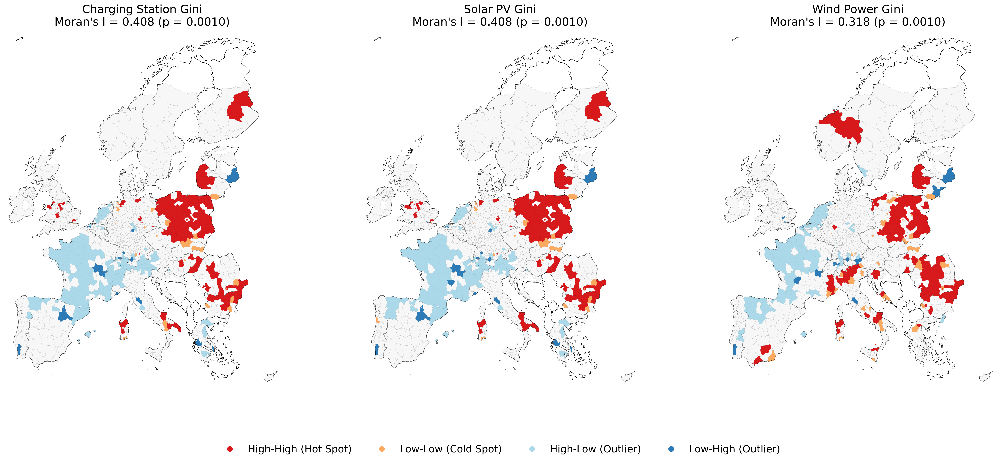

In [2]:
import geopandas as gpd
from esda.moran import Moran, Moran_Local
from libpysal.weights import KNN
import numpy as np
import matplotlib.pyplot as plt

# Define the Gini coefficient fields to analyze
gini_fields = ['charging_station_Gini', 'solar_Gini', 'wind_Gini']

# Load and preprocess the data
gdf = gpd.read_file('eu_nuts_with_Gini.geojson', engine='pyogrio')
gdf = gdf[gdf['wind_Gini'].notna()]  # Keep only regions with valid wind Gini data; use original lat-lon CRS

# Filter for NUTS3 level regions and exclude Turkey (TR)
gdf_eu = gdf[(gdf['LEVL_CODE'] == 3) & (gdf['CNTR_CODE'] != 'TR')].copy()

# Extract centroid coordinates for building spatial weights (only for valid data)
coords = np.column_stack((gdf_eu.centroid.x, gdf_eu.centroid.y))

# Construct KNN spatial weights matrix (4 nearest neighbors)
w = KNN.from_array(coords, k=4)
w.transform = 'r'  # Row-standardize the weights

# Load European country boundary data (NUTS0 level) and exclude Turkey
boundary_gdf = gpd.read_file('NUTS_RG_20M_2021_4326.geojson', engine='pyogrio')
boundary_gdf = boundary_gdf[(boundary_gdf['LEVL_CODE'] == 0) & (boundary_gdf['CNTR_CODE'] != 'TR')]
# Keep original lat-lon coordinate system (no projection transformation)

# Create figure and subplots (1 row, 3 columns)
fig, axes = plt.subplots(1, 3, figsize=(24, 10), dpi=300)

# Define cluster type colors and labels (in English)
cluster_colors = {
    1: '#d7191c',  # High-High
    2: '#fdaa61',  # Low-Low
    3: '#abd9e9',  # High-Low
    4: '#2c7bb6'   # Low-High
}

cluster_labels = {
    1: 'High-High (Hot Spot)',
    2: 'Low-Low (Cold Spot)',
    3: 'High-Low (Outlier)',
    4: 'Low-High (Outlier)'
}

# Titles for each subplot
titles = {
    'charging_station_Gini': 'Charging Station Gini',
    'solar_Gini': 'Solar PV Gini',
    'wind_Gini': 'Wind Power Gini'
}

# Generate LISA cluster maps for each Gini coefficient
for idx, gini_field in enumerate(gini_fields):
    ax = axes[idx]
    
    # Plot base layer: all NUTS3 regions (white fill, faint internal boundaries)
    gdf_eu.plot(
        ax=ax,
        color='white',
        edgecolor=(0, 0, 0, 0.3),  # Light gray with transparency
        linewidth=0.1,
        alpha=0.7,
        zorder=1
    )
    
    # Plot the external boundary of Europe (country outlines)
    boundary_gdf.boundary.plot(
        ax=ax,
        color='black',
        linewidth=0.5,
        zorder=2
    )

    # Compute Global and Local Moran's I
    moran = Moran(gdf_eu[gini_field].values, w)
    lisa = Moran_Local(gdf_eu[gini_field].values, w)

    # Store LISA results back into the GeoDataFrame
    gdf_eu[f'lisa_significant_{gini_field}'] = lisa.p_sim < 0.05
    gdf_eu[f'lisa_cluster_{gini_field}'] = lisa.q

    print(f"{gini_field.replace('_', ' ').title()}:")
    print(f"Moran's I = {moran.I:.3f} (p = {moran.p_sim:.4f})")

    # Plot significantly clustered regions
    significant = gdf_eu[gdf_eu[f'lisa_significant_{gini_field}']]
    for cluster, color in cluster_colors.items():
        cluster_data = significant[significant[f'lisa_cluster_{gini_field}'] == cluster]
        if not cluster_data.empty:
            cluster_data.plot(
                ax=ax,
                color=color,
                edgecolor='none',
                label=cluster_labels[cluster],
                zorder=3
            )

    # Plot non-significant regions (light gray)
    non_significant = gdf_eu[~gdf_eu[f'lisa_significant_{gini_field}']]
    if not non_significant.empty:
        non_significant.plot(
            ax=ax,
            color='#f0f0f0',
            edgecolor='none',
            alpha=0.5,
            zorder=2.5
        )

    # Set subplot title
    title = titles[gini_field]
    if moran is not None:
        title += f"\nMoran's I = {moran.I:.3f} (p = {moran.p_sim:.4f})"
    ax.set_title(title, fontsize=18)
    ax.set_axis_off()

# Add unified legend (English labels)
handles = [
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color,
               markersize=10, label=label)
    for color, label in zip(cluster_colors.values(), cluster_labels.values())
]

fig.legend(
    handles=handles,
    loc='lower center',
    ncol=4,
    bbox_to_anchor=(0.5, -0.02),
    frameon=False,
    fontsize=16
)

# Adjust layout to make room for the legend
plt.tight_layout()
plt.subplots_adjust(bottom=0.15)

# Set map extent to focus on mainland Europe
xmin, ymin, xmax, ymax = -11, 34, 35, 72  # Adjust as needed to cover Europe
for ax in axes:
    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)

# Display the plot
# Optional: Save the figure
# plt.savefig('Europe_Mainland_LISA_Clusters.png', bbox_inches='tight', dpi=300)
plt.show()

C:\Windows\Temp\ipykernel_15944\603707331.py:21: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  coords = np.column_stack((gdf_analysis.centroid.x, gdf_analysis.centroid.y))


Charging Station Gini:
Moran's I = 0.244 (p = 0.0010)
Solar Gini:
Moran's I = 0.244 (p = 0.0010)
Wind Gini:
Moran's I = 0.240 (p = 0.0010)


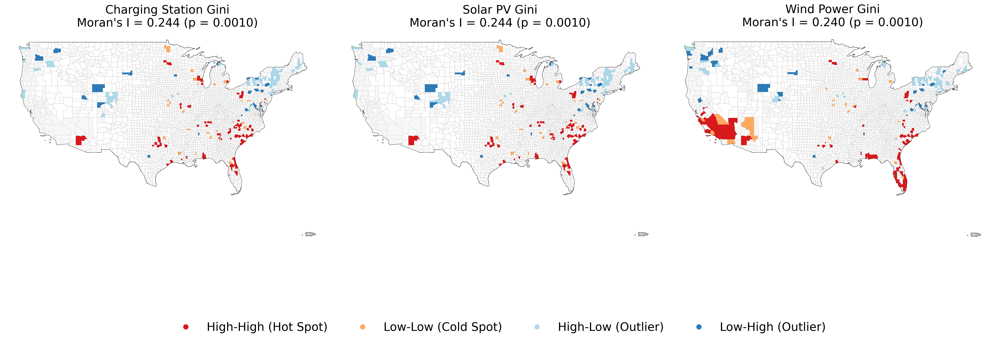

In [3]:

import geopandas as gpd
from esda.moran import Moran, Moran_Local
from libpysal.weights import KNN
import numpy as np
import matplotlib.pyplot as plt

# Define the Gini coefficient fields to analyze
gini_fields = ['charging_station_Gini', 'solar_Gini', 'wind_Gini']

# Load and preprocess data (exclude Alaska and Hawaii)
gdf_us = gpd.read_file('us_counties_with_Gini.geojson', engine='pyogrio')
gdf_us = gdf_us[~gdf_us['STATEFP'].isin(['02', '15'])]  # Exclude Alaska (02) and Hawaii (15)

# Extract all counties to construct the contiguous U.S. outline
usa_outline = gdf_us.dissolve(by=None).boundary  # Merge all counties into a single geometry and extract its boundary

# Filter counties with complete Gini coefficient data for spatial analysis
gdf_analysis = gdf_us[gdf_us[gini_fields].notna().all(axis=1)].copy()

# Extract centroid coordinates for building spatial weights matrix
coords = np.column_stack((gdf_analysis.centroid.x, gdf_analysis.centroid.y))

# Construct KNN spatial weights matrix (4 nearest neighbors)
w = KNN.from_array(coords, k=4)
w.transform = 'r'  # Row-standardize the weights

# Create figure and subplots (1 row, 3 columns)
fig, axes = plt.subplots(1, 3, figsize=(24, 8), dpi=300)

# Define cluster type colors and labels (in English)
cluster_colors = {
    1: '#d7191c',  # High-High (Hot Spot)
    2: '#fdaa61',  # Low-Low (Cold Spot)
    3: '#abd9e9',  # High-Low (Outlier)
    4: '#2c7bb6'   # Low-High (Outlier)
}

cluster_labels = {
    1: 'High-High (Hot Spot)',
    2: 'Low-Low (Cold Spot)',
    3: 'High-Low (Outlier)',
    4: 'Low-High (Outlier)'
}

# Titles for each subplot
titles = {
    'charging_station_Gini': 'Charging Station Gini',
    'solar_Gini': 'Solar PV Gini',
    'wind_Gini': 'Wind Power Gini'
}

# Generate LISA cluster maps for each Gini coefficient
for idx, gini_field in enumerate(gini_fields):
    ax = axes[idx]
    
    # Plot base layer: all counties (white fill, faint internal boundaries)
    gdf_us.plot(
        ax=ax,
        color='white',
        edgecolor=(0, 0, 0, 0.3),  # Faint internal boundaries (consistent with European map style)
        linewidth=0.1,
        alpha=0.7,
        zorder=1
    )

    # Plot the external boundary of the contiguous United States
    usa_outline.plot(
        ax=ax,
        color='black',
        linewidth=0.5,
        zorder=2
    )

    # Perform spatial analysis only on counties with complete data
    if len(gdf_analysis) > 0:
        # Compute Global and Local Moran's I
        moran = Moran(gdf_analysis[gini_field].values, w)
        lisa = Moran_Local(gdf_analysis[gini_field].values, w)

        # Store results back into the analysis dataset
        gdf_analysis[f'lisa_significant_{gini_field}'] = lisa.p_sim < 0.05
        gdf_analysis[f'lisa_cluster_{gini_field}'] = lisa.q

        print(f"{gini_field.replace('_', ' ').title()}:")
        print(f"Moran's I = {moran.I:.3f} (p = {moran.p_sim:.4f})")

        # Plot significantly clustered regions
        significant = gdf_analysis[gdf_analysis[f'lisa_significant_{gini_field}']]
        for cluster, color in cluster_colors.items():
            cluster_data = significant[significant[f'lisa_cluster_{gini_field}'] == cluster]
            if not cluster_data.empty:
                cluster_data.plot(
                    ax=ax,
                    color=color,
                    edgecolor='none',
                    label=cluster_labels[cluster],
                    zorder=3
                )

        # Plot non-significant regions (light gray, consistent with European map)
        non_significant = gdf_analysis[~gdf_analysis[f'lisa_significant_{gini_field}']]
        if not non_significant.empty:
            non_significant.plot(
                ax=ax,
                color='#f0f0f0',
                edgecolor='none',
                alpha=0.5,
                zorder=2.5
            )
    else:
        moran = None

    # Set subplot title
    title = titles[gini_field]
    if moran is not None:
        title += f"\nMoran's I = {moran.I:.3f} (p = {moran.p_sim:.4f})"
    ax.set_title(title, fontsize=20)
    ax.set_axis_off()

# Add unified legend (in English)
handles = [
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color,
               markersize=10, label=label)
    for color, label in zip(cluster_colors.values(), cluster_labels.values())
]

fig.legend(
    handles=handles,
    loc='lower center',
    ncol=4,
    bbox_to_anchor=(0.5, -0.05),
    frameon=False,
    fontsize=20
)

# Adjust layout to make room for the legend
plt.tight_layout()
plt.subplots_adjust(bottom=0.15)  # Make space for the legend

# Display the plot
# Optional: Save the figure
# plt.savefig('US_Counties_LISA_Clusters.png', dpi=300, bbox_inches='tight', facecolor='white')
plt.show()


# Visualization of the Gini coefficient correlation in Figure 3c

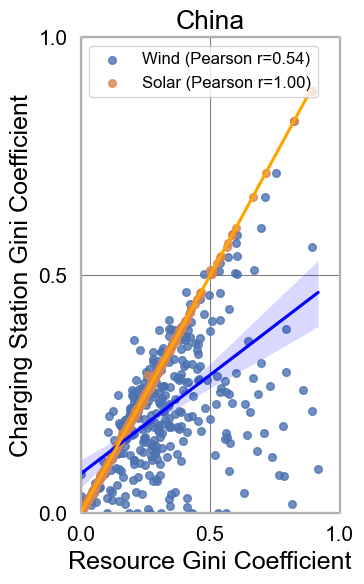

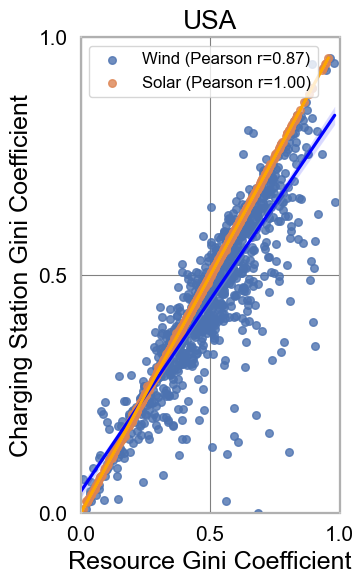

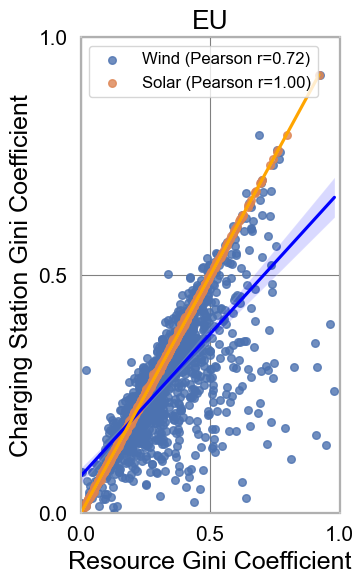

In [22]:
import pandas as pd
import numpy as np
from scipy.stats import pearsonr, spearmanr
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.patches import Rectangle

# 设置绘图风格（白色背景 + 网格线）
sns.set(style="whitegrid")

# 自定义网格线样式
plt.rcParams.update({
    'axes.grid': True,
    'grid.color': 'gray',
    'grid.linestyle': '-',
    'grid.linewidth': 0.8,
    'grid.alpha': 1.0,

    # 字体颜色设置为黑色
    'text.color': 'black',
    'axes.labelcolor': 'black',
    'xtick.color': 'black',
    'ytick.color': 'black'
})

# 读取两个表格
df_wind_pv = pd.read_csv('Combined_gini_coefficients_all_regionsWindSolarUSAChinaEU.csv')
df_no_wind_pv = pd.read_csv('Combined_gini_coefficients_all_regionsNOWindsolar.csv')

# 重命名充电站基尼系数列
df_no_wind_pv = df_no_wind_pv.rename(columns={'Gini_Coefficient': 'Gini_ChargeStation'})

# 透视表，将风能和光伏资源的基尼系数转换为宽格式
df_pivot = df_wind_pv.pivot_table(index=['City', 'Region'],
                                  columns='Supply_Type',
                                  values='Gini_Coefficient').reset_index()

# 合并数据集
df_merged = pd.merge(df_pivot, df_no_wind_pv[['City', 'Region', 'Gini_ChargeStation']],
                     on=['City', 'Region'], how='inner')

# 定义区域
regions = ['China', 'USA', 'EU']

# 存储结果
result_list = []

# 定义能源类型及其映射关系
energy_type_map = {
    'power_density': 'Wind',
    'GHI_value': 'Solar'
}

# 颜色定义
color_map = {
    'Wind': 'blue',
    'Solar': 'orange'
}

# ================== 绘制散点图 ==================

# 创建图形：每个地区一张图
for region in regions:
    df_region = df_merged[df_merged['Region'] == region]
    if not df_region.empty:

        # 创建图形
        fig, ax = plt.subplots(figsize=(3.8, 6))

        # 存储相关系数信息
        info_texts = []

        for col, energy_name in energy_type_map.items():
            if col in df_region.columns:
                # 筛掉NaN和inf
                df_valid = df_region[[col, 'Gini_ChargeStation']].replace([np.inf, -np.inf], np.nan).dropna()
                if len(df_valid) > 1:
                    x = df_valid[col]
                    y = df_valid['Gini_ChargeStation']

                    # 计算相关系数
                    pearson_corr, _ = pearsonr(x, y)
                    spearman_corr, _ = spearmanr(x, y)

                    # 绘制散点图 + 回归线
                    sns.regplot(x=x, y=y, data=df_valid,
                                scatter_kws={'s': 30}, line_kws={"color": color_map[energy_name]},
                                label=f'{energy_name} (Pearson r={pearson_corr:.2f})', ax=ax)

                    # 添加相关系数文本（暂存，最后统一排版）
                    info_texts.append({
                        'name': energy_name,
                        'pearson': pearson_corr,
                        'spearman': spearman_corr
                    })

        # 添加标题和标签
        ax.set_title(f'{region}', fontsize=19, color='black')
        ax.set_xlabel('Resource Gini Coefficient', fontsize=18, color='black')
        ax.set_ylabel('Charging Station Gini Coefficient', fontsize=18, color='black')
        ax.tick_params(axis='both', labelsize=15)

        # 添加图例
        ax.legend(fontsize=12, loc='upper left')

        # 设置横纵坐标范围一致，便于比较
        ax.set_xlim(0, 1)
        ax.set_ylim(0, 1)

        # 添加外部实线边框
        ax.add_patch(Rectangle((0, 0), 1, 1,
                               fill=False,
                               edgecolor="black",
                               lw=1.5,
                               transform=ax.transAxes,
                               clip_on=False))

        # 设置网格线
        ax.grid(True, which='both', linestyle='-', linewidth=0.8, color='gray', alpha=1.0)

        # 设置固定刻度位置
        ax.xaxis.set_ticks([0.0, 0.5, 1.0])
        ax.yaxis.set_ticks([0.0, 0.5, 1.0])

        plt.tight_layout()
        plt.show()

# The following is the alternative content visualizing the difference of the Gini coefficient

C:\Users\ZF\anaconda3\envs\new_env_spatial1\lib\site-packages\geopandas\geodataframe.py:1750: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  result = super().__getitem__(key)


China charging_station: 有效区域 341/388


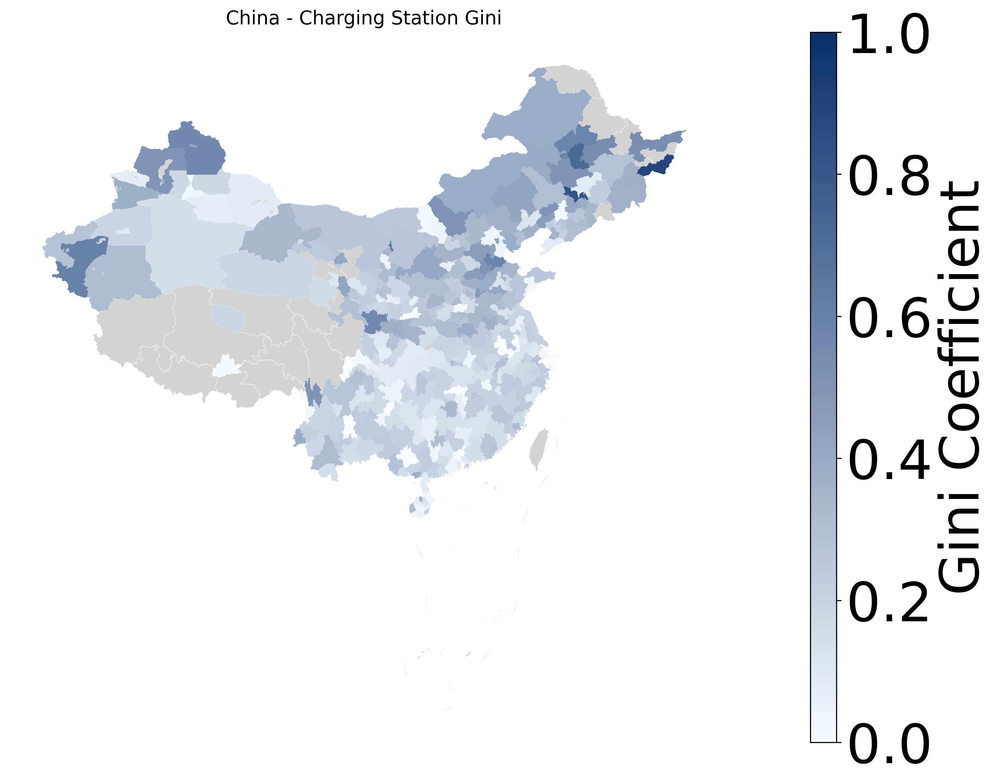

Visualized: china_charging_station_gini
USA charging_station: 有效区域 982/3186


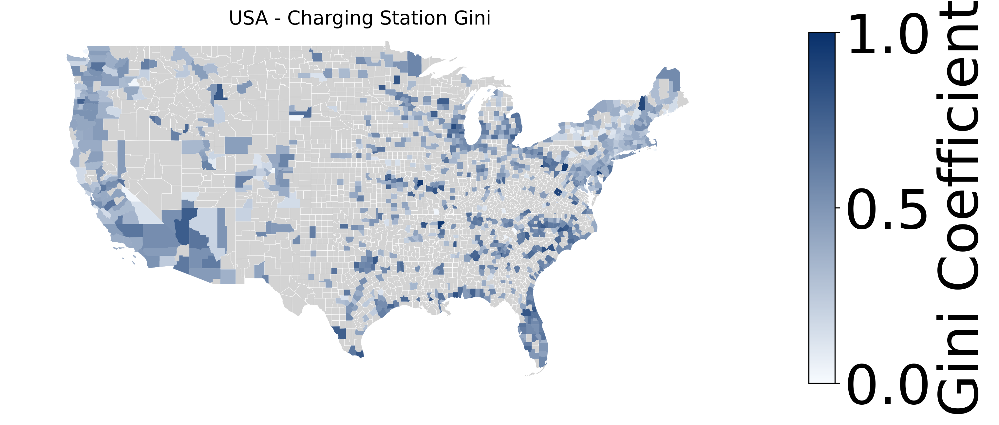

Visualized: usa_charging_station_gini
EU charging_station: 有效区域 1302/1433


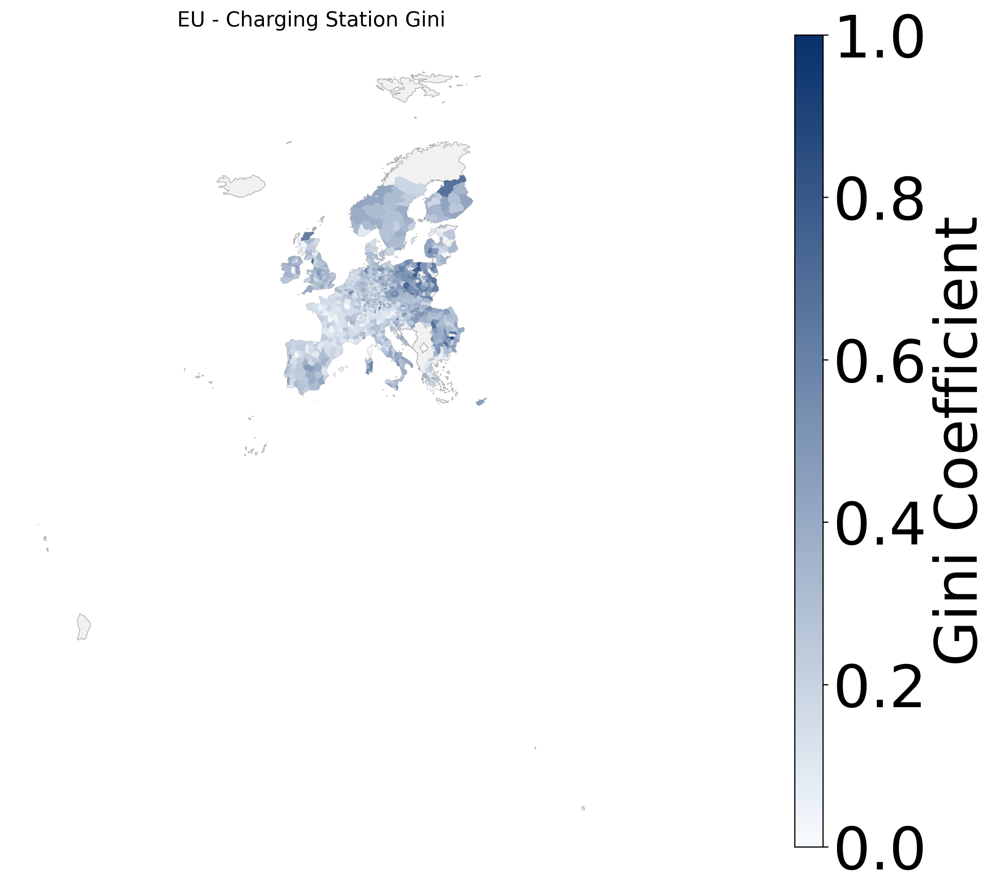

Visualized: eu_charging_station_gini
China solar: 有效区域 341/388


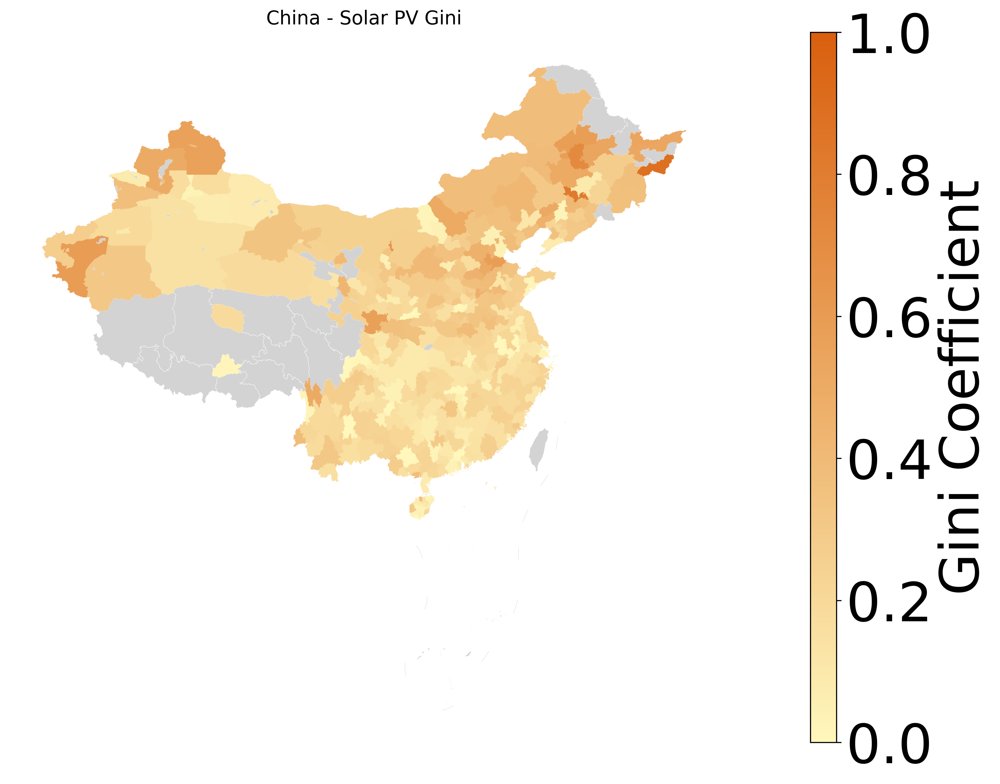

Visualized: china_solar_gini
USA solar: 有效区域 982/3186


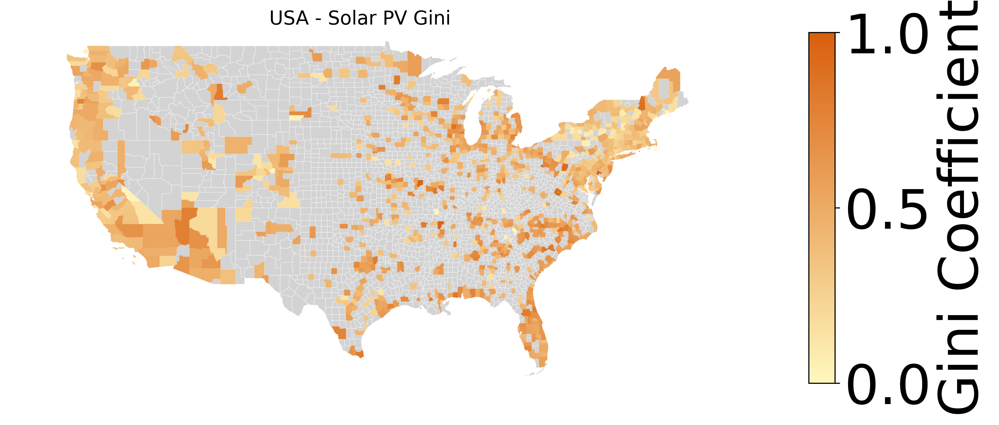

Visualized: usa_solar_gini
EU solar: 有效区域 1302/1433


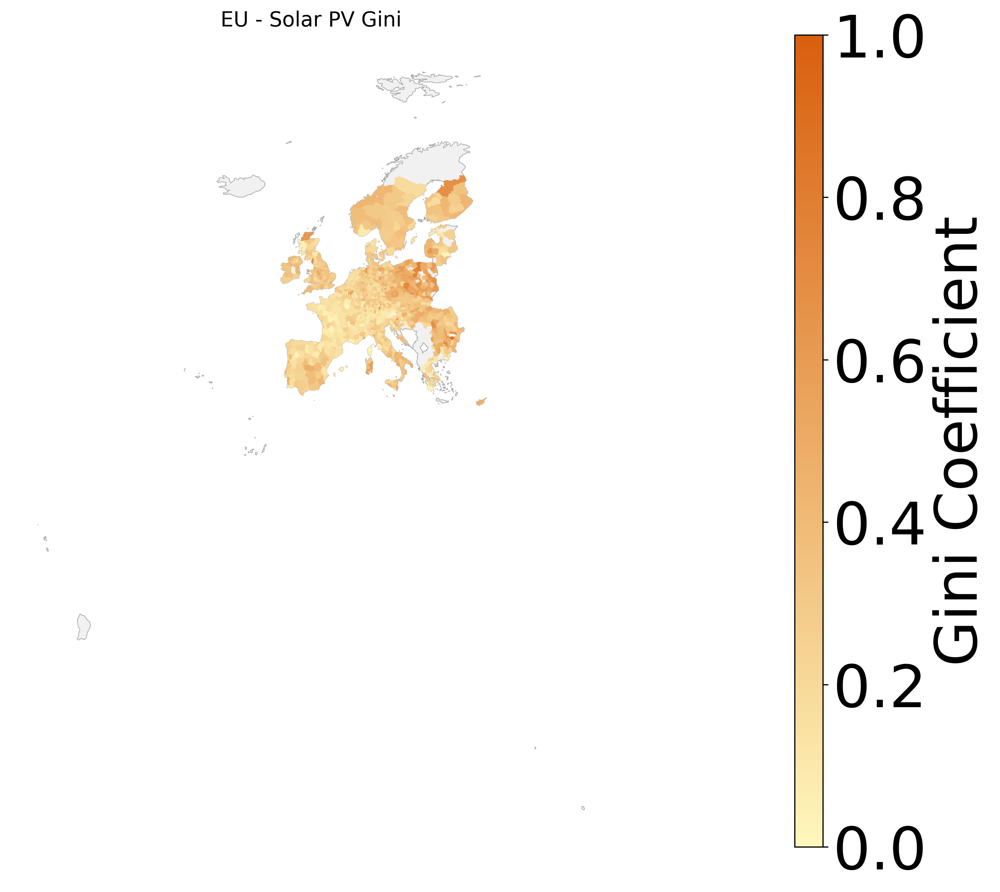

Visualized: eu_solar_gini
China wind: 有效区域 337/388


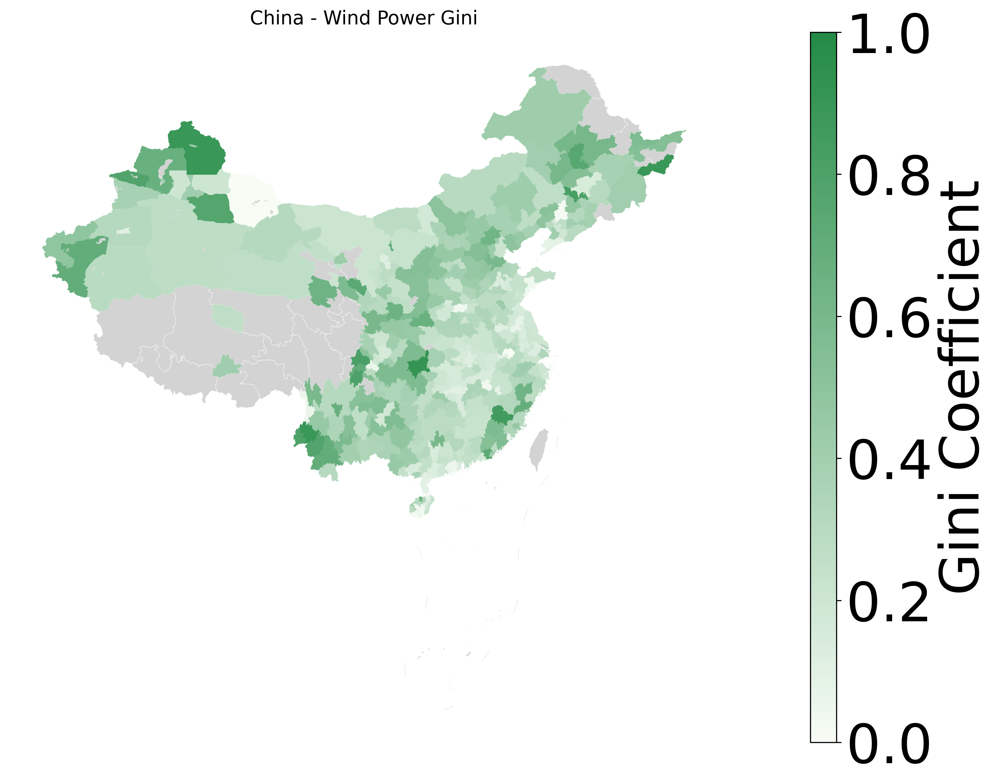

Visualized: china_wind_gini
USA wind: 有效区域 979/3186


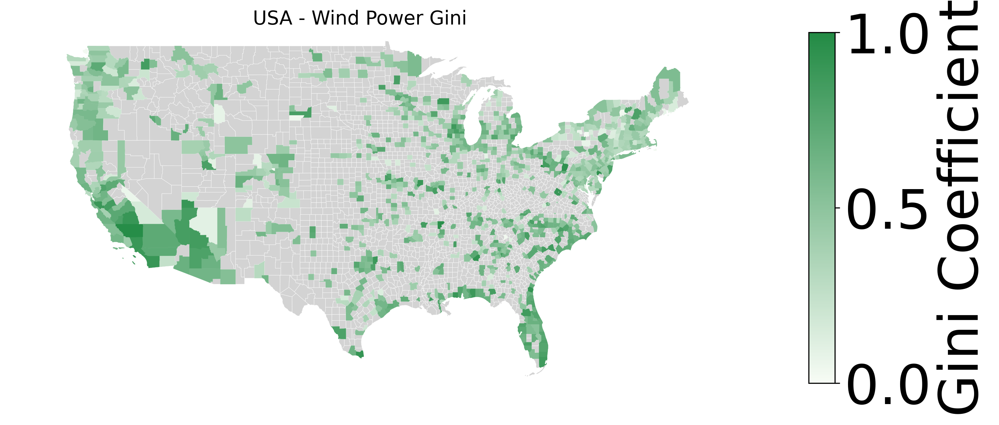

Visualized: usa_wind_gini
EU wind: 有效区域 1295/1433


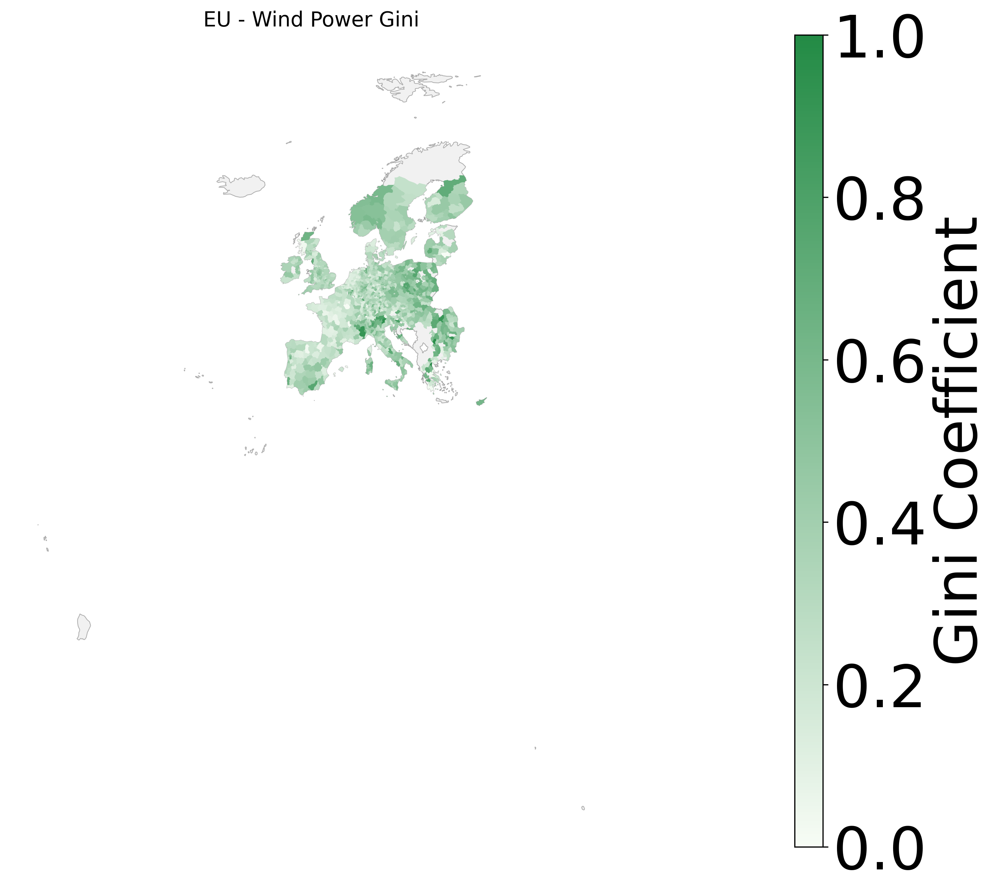

Visualized: eu_wind_gini
所有地图可视化完成！


In [17]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from mpl_toolkits.axes_grid1 import make_axes_locatable

# 1. Define color schemes and plotting parameters
gini_cmaps = {
    'charging_station': LinearSegmentedColormap.from_list('charging', ['#f7fbff', '#08306b']),
    'solar': LinearSegmentedColormap.from_list('solar', ['#fff7bc', '#d95f0e']),
    'wind': LinearSegmentedColormap.from_list('wind', ['#f7fcf5', '#238b45'])
}

titles = {
    'charging_station': 'Charging Station Gini',
    'solar': 'Solar PV Gini',
    'wind': 'Wind Power Gini'
}

# 2. Improved plotting function to visualize maps (not save), with legend font size control
def plot_gini_map(gdf, gini_type, region_name, bounds=None):
    fig, ax = plt.subplots(figsize=(12, 10), dpi=300)
    
    # Plot base map
    if region_name == 'EU':
        eu_base = gpd.read_file('eu_nuts_with_Gini.geojson', engine='pyogrio')
        eu_base[eu_base['CNTR_CODE'] != 'TR'].dissolve().plot(
            ax=ax, color='lightgrey', edgecolor='black', linewidth=0.5, alpha=0.3)
    else:
        gdf.plot(ax=ax, color='lightgrey', edgecolor='white', linewidth=0.2)
    
    # Filter valid data (non-missing Gini values)
    valid_gdf = gdf[gdf[f'{gini_type}_Gini'].notna()]
    print(f"{region_name} {gini_type}: {len(valid_gdf)} valid regions out of {len(gdf)}")

    vmin, vmax = 0, 1
    
    # Plot valid data with specified colormap
    valid_gdf.plot(column=f'{gini_type}_Gini', 
                   ax=ax,
                   cmap=gini_cmaps[gini_type],
                   legend=False,
                   vmin=vmin,
                   vmax=vmax,
                   missing_kwds={'color': 'lightgrey'},
                   edgecolor='face',
                   linewidth=0.1)
    
    # Set title
    ax.set_title(f'{region_name} - {titles[gini_type]}', fontsize=14)
    
    # Apply spatial bounds if specified (e.g., for USA)
    if bounds:
        ax.set_xlim(bounds[0], bounds[1])
        ax.set_ylim(bounds[2], bounds[3])
    
    # Remove axis labels and ticks
    ax.set_axis_off()
    
    # Add professional colorbar with font size control
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="3%", pad=0.1)
    sm = plt.cm.ScalarMappable(cmap=gini_cmaps[gini_type], norm=plt.Normalize(vmin, vmax))
    sm._A = []  # Dummy array to avoid warning
    cbar = fig.colorbar(sm, cax=cax, label='Gini Coefficient')

    # Set font sizes for colorbar
    cbar.ax.tick_params(labelsize=40)  # Tick label font size
    cbar.set_label('Gini Coefficient', fontsize=40)  # Colorbar label font size

    plt.show()  # Display the map instead of saving

# 3. Load regional datasets
regions = {
    'China': gpd.read_file('china_cities_with_Gini.geojson', engine='pyogrio'),
    'USA': gpd.read_file('us_counties_with_Gini.geojson', engine='pyogrio')[
        ~gpd.read_file('us_counties_with_Gini.geojson', engine='pyogrio')['STATEFP'].isin(['02', '15'])
    ],
    'EU': gpd.read_file('eu_nuts_with_Gini.geojson', engine='pyogrio')[
        gpd.read_file('eu_nuts_with_Gini.geojson', engine='pyogrio')['LEVL_CODE'] == 3
    ].copy()[
        gpd.read_file('eu_nuts_with_Gini.geojson', engine='pyogrio')['CNTR_CODE'] != 'TR'
    ]
}

# 4. Generate and display Gini maps for each region and energy type
for gini_type in ['charging_station', 'solar', 'wind']:
    for region_name, gdf in regions.items():
        bounds = None
        if region_name == 'USA':
            bounds = [-130, -65, 24, 50]  # Approximate bounds for contiguous US
        plot_gini_map(gdf, gini_type, region_name, bounds)
        print(f"Visualized: {region_name.lower()}_{gini_type}_gini")

print("All maps have been visualized!")

# Sensitivity Analysis

C:\Windows\Temp\ipykernel_19964\3778222961.py:6: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn')


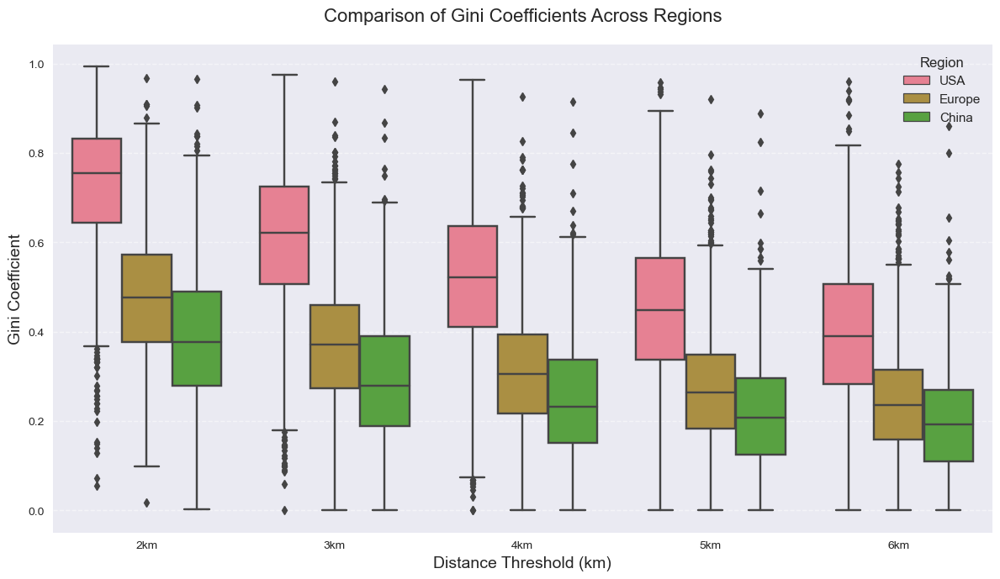


Descriptive Statistics by Region and Distance:
                  count      mean       std       min       25%       50%  \
Region Distance                                                             
China  2km        341.0  0.391749  0.171910  0.003331  0.278688  0.376033   
       3km        341.0  0.297012  0.160513  0.000000  0.188693  0.278386   
       4km        341.0  0.249703  0.150979  0.000000  0.151282  0.231819   
       5km        341.0  0.221472  0.143594  0.000000  0.124994  0.207668   
       6km        341.0  0.203012  0.137045  0.000000  0.108898  0.192748   
Europe 2km       1301.0  0.478633  0.146994  0.016773  0.376027  0.475518   
       3km       1301.0  0.375213  0.139625  0.000000  0.273952  0.371571   
       4km       1301.0  0.314981  0.133481  0.000000  0.217325  0.305968   
       5km       1301.0  0.275386  0.129396  0.000000  0.183856  0.263333   
       6km       1301.0  0.246898  0.125055  0.000000  0.158381  0.235862   
USA    2km        984.0  0.7

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Set plotting style
plt.style.use('seaborn')
sns.set_palette("husl")

# 1. Read and process USA data
usa_df = pd.read_csv('merged_USA_gini_results_all_distances_no_supply.csv')
usa_melted = usa_df.melt(id_vars=['City'], 
                         var_name='Distance', 
                         value_name='Gini_Coefficient')
usa_melted['Distance'] = usa_melted['Distance'].str.extract('(\d+km)')
usa_melted['Region'] = 'USA'

# 2. Read and process European data
eu_df = pd.read_csv('merged_EU_gini_results_all_distances.csv')
eu_melted = eu_df.melt(id_vars=['City', 'Supply_Type'], 
                       var_name='Distance', 
                       value_name='Gini_Coefficient')
eu_melted['Distance'] = eu_melted['Distance'].str.extract('(\d+km)')
eu_melted['Region'] = 'Europe'

# 3. Read and process China data
china_df = pd.read_csv('merged_China_gini_results_all_distances.csv')
china_melted = china_df.melt(id_vars=['City'], 
                             var_name='Distance', 
                             value_name='Gini_Coefficient')
china_melted['Distance'] = china_melted['Distance'].str.extract('(\d+km)')
china_melted['Region'] = 'China'
china_melted = china_melted.rename(columns={'Gini_Coefficient': 'Gini_Coefficient'})

# 4. Combine the three datasets
combined_df = pd.concat([usa_melted, eu_melted, china_melted], ignore_index=True)

# 5. Set Distance as an ordered categorical variable
combined_df['Distance'] = pd.Categorical(combined_df['Distance'], 
                                         categories=['2km','3km','4km','5km','6km'],
                                         ordered=True)

# 6. Create comparative plot
plt.figure(figsize=(12, 7))
sns.boxplot(data=combined_df, x='Distance', y='Gini_Coefficient', hue='Region')

# Set title and labels
plt.title('Comparison of Gini Coefficients Across Regions', fontsize=16, pad=20)
plt.xlabel('Distance Threshold (km)', fontsize=14)
plt.ylabel('Gini Coefficient', fontsize=14)
plt.legend(title='Region', title_fontsize=12, fontsize=11)

# Set grid and styling
plt.grid(True, axis='y', linestyle='--', alpha=0.5)

# Adjust layout
plt.tight_layout()
plt.show()

# 7. Output descriptive statistics
print("\nDescriptive Statistics by Region and Distance:")
print(combined_df.groupby(['Region', 'Distance'])['Gini_Coefficient'].describe())

# The following is the sensitivity analysis of spatial autocorrelation

In [ ]:
import pandas as pd
import geopandas as gpd

# File paths
china_csv = 'merged_China_gini_results_all_distances.csv'
usa_csv = 'merged_USA_gini_results_all_distances_no_supply.csv'
eu_csv = 'merged_EU_gini_results_all_distances.csv'

china_geojson = '中国_市.geojson'
us_geojson = 'counties.geojson'
eu_geojson = 'NUTS_RG_20M_2021_4326.geojson'

output_china = 'China_cities_with_Gini_distances.geojson'
output_usa = 'Us_counties_with_Gini_distances.geojson'
output_eu = 'Eu_nuts_with_Gini_distances.geojson'

# Gini coefficient fields (in wide format)
gini_fields = [
    'Gini_Coefficient2km',
    'Gini_Coefficient3km',
    'Gini_Coefficient4km',
    'Gini_Coefficient5km',
    'Gini_Coefficient6km'
]

# -----------------------------
# 1. Read and process USA data (keep in wide format)
# -----------------------------
usa_df = pd.read_csv(usa_csv)
# Extract COUNTYNS and format as 8-digit string
usa_df['COUNTYNS'] = usa_df['CountyNS'].astype(str).str.zfill(8)
# Keep only required columns
usa_wide = usa_df[['COUNTYNS', 'City', 'State'] + gini_fields].copy()
usa_wide['Region'] = 'USA'

# -----------------------------
# 2. Read and process European data (keep in wide format)
# -----------------------------
eu_df = pd.read_csv(eu_csv)
# Merge into wide format
eu_wide = eu_df[['City'] + gini_fields].copy()
eu_wide['Region'] = 'EU'

# -----------------------------
# 3. Read and process China data (keep in wide format)
# -----------------------------
china_df = pd.read_csv(china_csv)
# Merge into wide format
china_wide = china_df[['City'] + gini_fields].copy()
china_wide['Region'] = 'China'

# -----------------------------
# 4. Load GeoJSON files
# -----------------------------
gdf_china = gpd.read_file(china_geojson, engine='pyogrio')
gdf_us = gpd.read_file(us_geojson, engine='pyogrio')
gdf_eu = gpd.read_file(eu_geojson, engine='pyogrio')

# Ensure all GeoDataFrames use EPSG:4326 (WGS84) coordinate reference system
if gdf_china.crs.to_epsg() != 4326:
    gdf_china = gdf_china.to_crs(epsg=4326)
if gdf_us.crs.to_epsg() != 4326:
    gdf_us = gdf_us.to_crs(epsg=4326)
if gdf_eu.crs.to_epsg() != 4326:
    gdf_eu = gdf_eu.to_crs(epsg=4326)

# -----------------------------
# 5. Merge tabular data with spatial data (wide format)
# -----------------------------
# China: Match by City name
gdf_china_merged = gdf_china.merge(china_wide, left_on='name', right_on='City', how='left')
print(f"Number of Chinese cities with new data: {gdf_china_merged[['City']].notna().sum().values[0]}")

# USA: Match by COUNTYNS
gdf_us_merged = gdf_us.merge(usa_wide, left_on='COUNTYNS', right_on='COUNTYNS', how='left')
print(f"Number of US counties with new data: {gdf_us_merged[['City']].notna().sum().values[0]}")

# Europe: Match by NUTS_NAME
gdf_eu_merged = gdf_eu.merge(eu_wide, left_on='NUTS_NAME', right_on='City', how='left')
print(f"Number of EU regions with new data: {gdf_eu_merged[['City']].notna().sum().values[0]}")

# -----------------------------
# 6. Save merged GeoDataFrames to GeoJSON files (wide format)
# -----------------------------
gdf_china_merged.to_file(output_china, driver='GeoJSON')
gdf_us_merged.to_file(output_usa, driver='GeoJSON')
gdf_eu_merged.to_file(output_eu, driver='GeoJSON')

print(f"✅ New GeoJSON files have been saved to: {output_china}, {output_usa}, and {output_eu}")


Checking for invalid geometries...
Found 1 invalid geometries, attempting to fix them.


C:\Windows\Temp\ipykernel_1604\566414076.py:52: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  coords = np.column_stack((gdf_analysis.centroid.x, gdf_analysis.centroid.y))


Gini_Coefficient2km:
Moran's I = 0.372 (p = 0.0010)
Gini_Coefficient3km:
Moran's I = 0.350 (p = 0.0010)
Gini_Coefficient4km:
Moran's I = 0.339 (p = 0.0010)
Gini_Coefficient5km:
Moran's I = 0.331 (p = 0.0010)
Gini_Coefficient6km:
Moran's I = 0.322 (p = 0.0010)


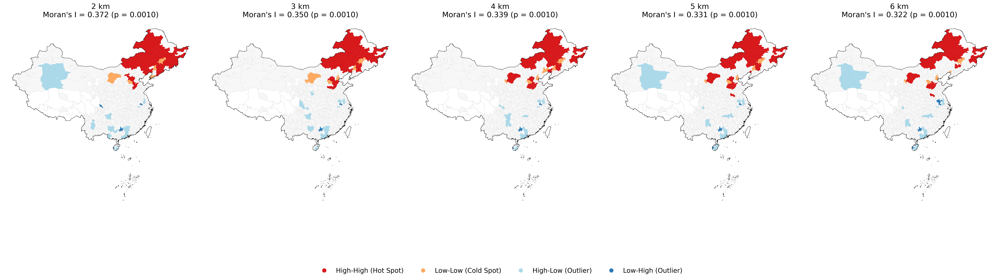

In [11]:
import geopandas as gpd
from esda.moran import Moran, Moran_Local
from libpysal.weights import KNN
import numpy as np
import matplotlib.pyplot as plt

# Define Gini coefficient fields for different distance thresholds
gini_fields = [
    'Gini_Coefficient2km',
    'Gini_Coefficient3km',
    'Gini_Coefficient4km',
    'Gini_Coefficient5km',
    'Gini_Coefficient6km'
]

# Load GeoJSON data (retain all cities)
gdf = gpd.read_file('China_cities_with_Gini_distances.geojson', engine='pyogrio')

# [New] Load municipal boundaries to construct China's overall outline
boundary_gdf = gpd.read_file('中国_市.geojson', engine='pyogrio')

# Check and fix invalid geometries
print("Checking for invalid geometries...")
invalid_geoms = boundary_gdf[~boundary_gdf.geometry.is_valid]
if not invalid_geoms.empty:
    print(f"Found {len(invalid_geoms)} invalid geometries, attempting to fix them.")
    boundary_gdf['geometry'] = boundary_gdf.buffer(0)  # Attempt to fix via zero-buffer

# Merge geometries to form national boundary
try:
    merged_geometry = boundary_gdf.geometry.union_all()
    if merged_geometry is None or merged_geometry.is_empty:
        raise ValueError("Merged geometry is empty. Please check input data completeness.")

    china_outline = merged_geometry.boundary
    if china_outline is None or china_outline.is_empty:
        raise ValueError("Extracted boundary is empty. Please verify input data correctness.")

    china_boundary = gpd.GeoSeries([china_outline], crs=boundary_gdf.crs)
except Exception as e:
    print(f"Failed to generate national outline: {e}")
    exit(1)

# Extract cities with complete Gini coefficient data for spatial analysis
missing_columns = [col for col in gini_fields if col not in gdf.columns]
if missing_columns:
    raise KeyError(f"Missing required fields: {missing_columns}. Please verify GeoJSON contains these columns.")

gdf_analysis = gdf[gdf[gini_fields].notna().all(axis=1)].copy()

# Extract centroid coordinates for spatial weights matrix (only for cities with data)
coords = np.column_stack((gdf_analysis.centroid.x, gdf_analysis.centroid.y))

# Construct KNN spatial weights matrix (4 nearest neighbors)
w = KNN.from_array(coords, k=4)
w.transform = 'r'  # Row-standardize weights

# Create subplots: one for each distance threshold
fig, axes = plt.subplots(1, len(gini_fields), figsize=(30, 8), dpi=300)

# Define cluster colors and labels (in English)
cluster_colors = {
    1: '#d7191c',  # High-High (Hot Spot)
    2: '#fdaa61',  # Low-Low (Cold Spot)
    3: '#abd9e9',  # High-Low (Outlier)
    4: '#2c7bb6'   # Low-High (Outlier)
}

cluster_labels = {
    1: 'High-High (Hot Spot)',
    2: 'Low-Low (Cold Spot)',
    3: 'High-Low (Outlier)',
    4: 'Low-High (Outlier)'
}

# Map field names to display titles
titles = {
    'Gini_Coefficient2km': '2 km',
    'Gini_Coefficient3km': '3 km',
    'Gini_Coefficient4km': '4 km',
    'Gini_Coefficient5km': '5 km',
    'Gini_Coefficient6km': '6 km'
}

# Generate a LISA cluster map for each distance threshold
for idx, gini_field in enumerate(gini_fields):
    ax = axes[idx]
    
    # Plot base layer: all cities (no fill, faint edges)
    gdf.plot(
        ax=ax,
        color='none',
        edgecolor=(0.5, 0.5, 0.5, 0.2),
        linewidth=0.1,
        alpha=0.7,
        zorder=1
    )

    # [New] Plot national outline (solid black line)
    if china_boundary is not None and not china_boundary.empty:
        china_boundary.plot(
            ax=ax,
            color='black',
            linewidth=0.5,
            zorder=4
        )
    else:
        print("China boundary could not be plotted because it is None or empty.")

    # Perform spatial analysis only on cities with valid data
    if len(gdf_analysis) > 0:
        # Compute Global Moran's I
        moran_global = Moran(gdf_analysis[gini_field].values, w)

        # Calculate Local Indicators of Spatial Association (LISA)
        lisa = Moran_Local(gdf_analysis[gini_field].values, w)
        gdf_analysis[f'lisa_significant_{gini_field}'] = lisa.p_sim < 0.05
        gdf_analysis[f'lisa_cluster_{gini_field}'] = lisa.q

        print(f"{gini_field}:")
        print(f"Moran's I = {moran_global.I:.3f} (p = {moran_global.p_sim:.4f})")

        # Plot significantly clustered areas
        significant = gdf_analysis[gdf_analysis[f'lisa_significant_{gini_field}']]
        for cluster, color in cluster_colors.items():
            cluster_data = significant[significant[f'lisa_cluster_{gini_field}'] == cluster]
            if not cluster_data.empty:
                cluster_data.plot(
                    ax=ax,
                    color=color,
                    edgecolor='none',
                    label=cluster_labels[cluster],
                    zorder=3
                )

        # Plot non-significant cities (light gray)
        non_significant = gdf_analysis[~gdf_analysis[f'lisa_significant_{gini_field}']]
        if not non_significant.empty:
            non_significant.plot(
                ax=ax,
                color='#f0f0f0',
                edgecolor='none',
                alpha=0.5,
                zorder=2.5
            )
    else:
        print(f"No data available for {gini_field}, skipping...")

    # Set title with Moran's I and p-value (consistent with EU/US style)
    title = titles[gini_field]
    if len(gdf_analysis) > 0:
        moran = Moran(gdf_analysis[gini_field].values, w)
        title += f"\nMoran's I = {moran.I:.3f} (p = {moran.p_sim:.4f})"
    ax.set_title(title, fontsize=16)
    ax.set_axis_off()

# Add unified legend (in English)
handles = [
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color,
               markersize=10, label=label)
    for color, label in zip(cluster_colors.values(), cluster_labels.values())
]

fig.legend(
    handles=handles,
    loc='lower center',
    ncol=4,
    bbox_to_anchor=(0.5, -0.05),
    frameon=False,
    fontsize=14
)

# Adjust layout to prevent overlap and accommodate legend
plt.tight_layout()
plt.subplots_adjust(bottom=0.15)  # Make space for legend

# Display the final plot
plt.show()

C:\Windows\Temp\ipykernel_1604\512968862.py:24: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  coords = np.column_stack((gdf_eu.centroid.x, gdf_eu.centroid.y))
C:\Users\ZF\anaconda3\envs\new_env_spatial1\lib\site-packages\libpysal\weights\weights.py:172: UserWarning: The weights matrix is not fully connected: 
 There are 5 disconnected components.
  warnings.warn(message)


Gini_Coefficient2km:
Moran's I = 0.569 (p = 0.0010)
Gini_Coefficient3km:
Moran's I = 0.510 (p = 0.0010)
Gini_Coefficient4km:
Moran's I = 0.453 (p = 0.0010)
Gini_Coefficient5km:
Moran's I = 0.402 (p = 0.0010)
Gini_Coefficient6km:
Moran's I = 0.366 (p = 0.0010)


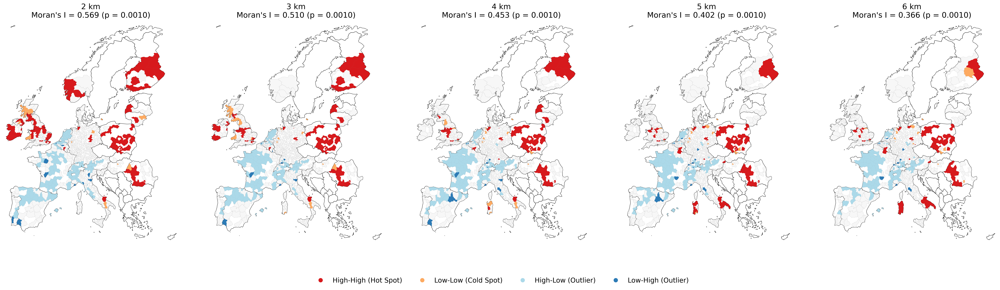

In [8]:
import geopandas as gpd
from esda.moran import Moran, Moran_Local
from libpysal.weights import KNN
import numpy as np
import matplotlib.pyplot as plt

# Define Gini coefficient fields for different distance thresholds
gini_fields = [
    'Gini_Coefficient2km',
    'Gini_Coefficient3km',
    'Gini_Coefficient4km',
    'Gini_Coefficient5km',
    'Gini_Coefficient6km'
]

# Load and preprocess data
gdf = gpd.read_file('eu_nuts_with_Gini_distances.geojson', engine='pyogrio')
gdf = gdf[gdf['Gini_Coefficient4km'].notna()]  # Use original lat-lon coordinates; no projection transformation

# Filter for NUTS3-level regions and completely exclude Turkey
gdf_eu = gdf[(gdf['LEVL_CODE'] == 3) & (gdf['CNTR_CODE'] != 'TR')].copy()

# Extract centroid coordinates for spatial weights matrix (only for regions with data)
coords = np.column_stack((gdf_eu.centroid.x, gdf_eu.centroid.y))

# Construct KNN spatial weights matrix (4 nearest neighbors)
w = KNN.from_array(coords, k=4)
w.transform = 'r'  # Row-standardize weights

# Load European national boundary data (NUTS0 level), excluding Turkey
boundary_gdf = gpd.read_file('NUTS_RG_20M_2021_4326.geojson', engine='pyogrio')
boundary_gdf = boundary_gdf[(boundary_gdf['LEVL_CODE'] == 0) & (boundary_gdf['CNTR_CODE'] != 'TR')]

# Create subplots: one row with five columns
fig, axes = plt.subplots(1, len(gini_fields), figsize=(30, 8), dpi=300)

# Define cluster colors and labels (in English)
cluster_colors = {
    1: '#d7191c',  # High-High
    2: '#fdaa61',  # Low-Low
    3: '#abd9e9',  # High-Low
    4: '#2c7bb6'   # Low-High
}

cluster_labels = {
    1: 'High-High (Hot Spot)',
    2: 'Low-Low (Cold Spot)',
    3: 'High-Low (Outlier)',
    4: 'Low-High (Outlier)'
}

# Map field names to display titles
titles = {
    'Gini_Coefficient2km': '2 km',
    'Gini_Coefficient3km': '3 km',
    'Gini_Coefficient4km': '4 km',
    'Gini_Coefficient5km': '5 km',
    'Gini_Coefficient6km': '6 km'
}

# Generate a LISA cluster map for each distance threshold
for idx, gini_field in enumerate(gini_fields):
    ax = axes[idx]
    
    # Plot base layer: all regions (white fill, faint internal boundaries)
    gdf_eu.plot(
        ax=ax,
        color='white',
        edgecolor=(0, 0, 0, 0.3),
        linewidth=0.1,
        alpha=0.7,
        zorder=1
    )
    
    # Plot external boundary of Europe (national outlines)
    boundary_gdf.boundary.plot(
        ax=ax,
        color='black',
        linewidth=0.5,
        zorder=2
    )

    # Compute Global and Local Moran's I
    moran = Moran(gdf_eu[gini_field].values, w)
    lisa = Moran_Local(gdf_eu[gini_field].values, w)

    # Store results in the GeoDataFrame
    gdf_eu[f'lisa_significant_{gini_field}'] = lisa.p_sim < 0.05
    gdf_eu[f'lisa_cluster_{gini_field}'] = lisa.q

    print(f"{gini_field}:")
    print(f"Moran's I = {moran.I:.3f} (p = {moran.p_sim:.4f})")

    # Plot significantly clustered regions
    significant = gdf_eu[gdf_eu[f'lisa_significant_{gini_field}']]
    for cluster, color in cluster_colors.items():
        cluster_data = significant[significant[f'lisa_cluster_{gini_field}'] == cluster]
        if not cluster_data.empty:
            cluster_data.plot(
                ax=ax,
                color=color,
                edgecolor='none',
                label=cluster_labels[cluster],
                zorder=3
            )

    # Plot non-significant regions (light gray)
    non_significant = gdf_eu[~gdf_eu[f'lisa_significant_{gini_field}']]
    if not non_significant.empty:
        non_significant.plot(
            ax=ax,
            color='#f0f0f0',
            edgecolor='none',
            alpha=0.5,
            zorder=2.5
        )

    # Set title with Moran's I and p-value
    title = titles[gini_field]
    if moran is not None:
        title += f"\nMoran's I = {moran.I:.3f} (p = {moran.p_sim:.4f})"
    ax.set_title(title, fontsize=16)
    ax.set_axis_off()

# Add unified legend (in English)
handles = [
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color,
               markersize=10, label=label)
    for color, label in zip(cluster_colors.values(), cluster_labels.values())
]

fig.legend(
    handles=handles,
    loc='lower center',
    ncol=4,
    bbox_to_anchor=(0.5, -0.02),
    frameon=False,
    fontsize=14
)

# Adjust layout to prevent overlap and accommodate legend
plt.tight_layout()
plt.subplots_adjust(bottom=0.15)  # Make space for legend

# Set map extent to focus on continental Europe
xmin, ymin, xmax, ymax = -11, 34, 35, 72  # Adjust as needed to cover European region
for ax in axes:
    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)

# Display the final plot
plt.show()



C:\Windows\Temp\ipykernel_1604\1423493419.py:27: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  coords = np.column_stack((gdf_analysis.centroid.x, gdf_analysis.centroid.y))


Gini_Coefficient2km:
Moran's I = 0.342 (p = 0.0010)
Gini_Coefficient3km:
Moran's I = 0.318 (p = 0.0010)
Gini_Coefficient4km:
Moran's I = 0.278 (p = 0.0010)
Gini_Coefficient5km:
Moran's I = 0.239 (p = 0.0010)
Gini_Coefficient6km:
Moran's I = 0.205 (p = 0.0010)


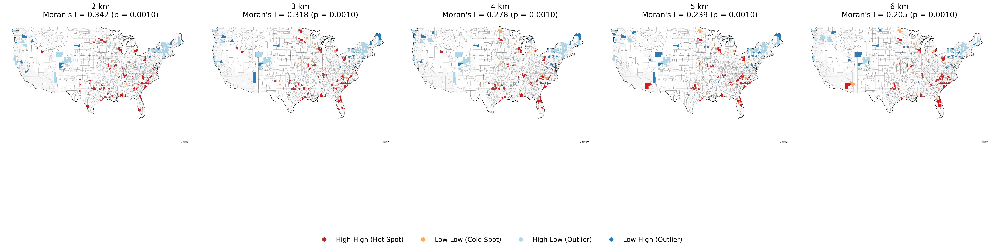

In [9]:
import geopandas as gpd
from esda.moran import Moran, Moran_Local
from libpysal.weights import KNN
import numpy as np
import matplotlib.pyplot as plt

# Define Gini coefficient fields for different distance thresholds
gini_fields = [
    'Gini_Coefficient2km',
    'Gini_Coefficient3km',
    'Gini_Coefficient4km',
    'Gini_Coefficient5km',
    'Gini_Coefficient6km'
]

# Load and preprocess data (exclude Alaska and Hawaii)
gdf_us = gpd.read_file('us_counties_with_Gini_distances.geojson', engine='pyogrio')
gdf_us = gdf_us[~gdf_us['STATEFP'].isin(['02', '15'])]  # Exclude Alaska (02) and Hawaii (15)

# Extract all counties to construct the contiguous U.S. outline
usa_outline = gdf_us.dissolve(by=None).boundary  # Merge all counties into a single geometry and extract its boundary

# Extract counties with complete Gini coefficient data for spatial analysis
gdf_analysis = gdf_us[gdf_us[gini_fields].notna().all(axis=1)].copy()

# Extract centroid coordinates for building spatial weights matrix
coords = np.column_stack((gdf_analysis.centroid.x, gdf_analysis.centroid.y))

# Construct KNN spatial weights matrix
w = KNN.from_array(coords, k=4)
w.transform = 'r'  # Row-standardize weights

# Create subplots: one row with five columns
fig, axes = plt.subplots(1, len(gini_fields), figsize=(30, 8), dpi=300)

# Define cluster type colors and labels (in English)
cluster_colors = {
    1: '#d7191c',  # High-High (Hot Spot)
    2: '#fdaa61',  # Low-Low (Cold Spot)
    3: '#abd9e9',  # High-Low (Outlier)
    4: '#2c7bb6'   # Low-High (Outlier)
}

cluster_labels = {
    1: 'High-High (Hot Spot)',
    2: 'Low-Low (Cold Spot)',
    3: 'High-Low (Outlier)',
    4: 'Low-High (Outlier)'
}

# Map field names to display titles
titles = {
    'Gini_Coefficient2km': '2 km',
    'Gini_Coefficient3km': '3 km',
    'Gini_Coefficient4km': '4 km',
    'Gini_Coefficient5km': '5 km',
    'Gini_Coefficient6km': '6 km'
}

# Generate a LISA cluster map for each distance threshold
for idx, gini_field in enumerate(gini_fields):
    ax = axes[idx]
    
    # Plot base layer: all counties (white fill, faint internal boundaries)
    gdf_us.plot(
        ax=ax,
        color='white',
        edgecolor=(0, 0, 0, 0.3),
        linewidth=0.1,
        alpha=0.7,
        zorder=1
    )

    # Plot the external boundary of the contiguous United States
    usa_outline.plot(
        ax=ax,
        color='black',
        linewidth=0.5,
        zorder=2
    )

    # Perform spatial analysis only on counties with complete data
    if len(gdf_analysis) > 0:
        # Compute Global and Local Moran's I
        moran = Moran(gdf_analysis[gini_field].values, w)
        lisa = Moran_Local(gdf_analysis[gini_field].values, w)

        # Store results in the analysis dataset
        gdf_analysis[f'lisa_significant_{gini_field}'] = lisa.p_sim < 0.05
        gdf_analysis[f'lisa_cluster_{gini_field}'] = lisa.q

        print(f"{gini_field}:")
        print(f"Moran's I = {moran.I:.3f} (p = {moran.p_sim:.4f})")

        # Plot significantly clustered areas
        significant = gdf_analysis[gdf_analysis[f'lisa_significant_{gini_field}']]
        for cluster, color in cluster_colors.items():
            cluster_data = significant[significant[f'lisa_cluster_{gini_field}'] == cluster]
            if not cluster_data.empty:
                cluster_data.plot(
                    ax=ax,
                    color=color,
                    edgecolor='none',
                    label=cluster_labels[cluster],
                    zorder=3
                )

        # Plot non-significant counties (light gray)
        non_significant = gdf_analysis[~gdf_analysis[f'lisa_significant_{gini_field}']]
        if not non_significant.empty:
            non_significant.plot(
                ax=ax,
                color='#f0f0f0',
                edgecolor='none',
                alpha=0.5,
                zorder=2.5
            )
    else:
        moran = None

    # Set title
    title = titles[gini_field]
    if moran is not None:
        title += f"\nMoran's I = {moran.I:.3f} (p = {moran.p_sim:.4f})"
    ax.set_title(title, fontsize=16)
    ax.set_axis_off()

# Add unified legend (in English)
handles = [
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color,
               markersize=10, label=label)
    for color, label in zip(cluster_colors.values(), cluster_labels.values())
]

fig.legend(
    handles=handles,
    loc='lower center',
    ncol=4,
    bbox_to_anchor=(0.5, -0.05),
    frameon=False,
    fontsize=14
)

# Adjust layout
plt.tight_layout()
plt.subplots_adjust(bottom=0.15)  # Make space for legend

# Display the final plot
plt.show()